<a href="https://colab.research.google.com/github/PiotrMaciejKowalski/BigData2024Project/blob/Analiza-szeregow-czasowych-dot-roslinnosci/colabs/Analiza_szeregow_czasowych_dot_roslinnosci.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Wczytywanie danych w sparku

Utworzenie środowiska pyspark do obliczeń:

In [1]:
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
!wget -q dlcdn.apache.org/spark/spark-3.5.0/spark-3.5.0-bin-hadoop3.tgz
!tar xf spark-3.5.0-bin-hadoop3.tgz
!pip install -q findspark

In [3]:
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.5.0-bin-hadoop3"

In [4]:
import findspark
findspark.init()

In [5]:
from typing import Tuple
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
from google.colab import drive
from pyspark.sql import SparkSession
from pyspark.sql import DataFrame as SparkDataFrame
from pyspark.sql.types import IntegerType, FloatType, StringType, StructType
import IPython
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics import tsaplots
from statsmodels.tsa.statespace.sarimax import SARIMAX, SARIMAXResults
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
import warnings
warnings.filterwarnings('ignore')

Utowrzenie sesji:

In [6]:
spark = SparkSession.builder\
        .master("local")\
        .appName("Colab")\
        .config('spark.ui.port', '4050')\
        .getOrCreate()

Połączenie z dyskiem:

In [7]:
drive.mount('/content/drive')

Mounted at /content/drive


Wczytanie danych NASA znajdujących się na dysku w sparku:

In [8]:
columns = ['lon', 'lat', 'Date', 'SWdown', 'LWdown', 'SWnet', 'LWnet', 'Qle', 'Qh', 'Qg', 'Qf', 'Snowf', 'Rainf', 'Evap', 'Qs', 'Qsb', 'Qsm', 'AvgSurfT', 'Albedo', 'SWE', 'SnowDepth', 'SnowFrac', 'SoilT_0_10cm', 'SoilT_10_40cm',
           'SoilT_40_100cm', 'SoilT_100_200cm', 'SoilM_0_10cm', 'SoilM_10_40cm', 'SoilM_40_100cm', 'SoilM_100_200cm', 'SoilM_0_100cm', 'SoilM_0_200cm', 'RootMoist', 'SMLiq_0_10cm', 'SMLiq_10_40cm', 'SMLiq_40_100cm', 'SMLiq_100_200cm',
           'SMAvail_0_100cm', 'SMAvail_0_200cm', 'PotEvap', 'ECanop', 'TVeg', 'ESoil', 'SubSnow', 'CanopInt', 'ACond', 'CCond', 'RCS', 'RCT', 'RCQ', 'RCSOL', 'RSmin','RSMacr', 'LAI', 'GVEG', 'Streamflow']

# Utworzenie schematu określającego typ zmiennych
schema = StructType()
for i in columns:
  if i == "Date":
    schema = schema.add(i, StringType(), True)
  else:
    schema = schema.add(i, FloatType(), True)

In [9]:
# Wczytanie zbioru Nasa w sparku
nasa = spark.read.format('csv').option("header", True).schema(schema).load('/content/drive/MyDrive/BigMess/NASA/NASA.csv')

Zanim zaczniemy pisać kwerendy należy jeszcze dodać nasz DataFrame (df) do "przestrzeni nazw tabel" Sparka:

In [10]:
nasa.createOrReplaceTempView("nasa")

Rozdzielenie kolumny "Date" na kolumny "Year" oraz "Month"

In [11]:
nasa_ym = spark.sql("""
          SELECT
          CAST(SUBSTRING(CAST(Date AS STRING), 1, 4) AS INT) AS Year,
          CAST(SUBSTRING(CAST(Date AS STRING), 5, 2) AS INT) AS Month,
          n.*
          FROM nasa n
          """)

In [12]:
nasa_ym = nasa_ym.drop("Date")
nasa_ym.createOrReplaceTempView("nasa_ym")

# Analiza szergów czasowych - tylko wybrane kolumny z pliku "research.md"

In [13]:
# Wyzanczenie unikatowych par współrzednych ze zbioru Nasa i zapisanie w Pandas
%%time
distinct_wsp = spark.sql("""
                          SELECT DISTINCT lon, lat FROM nasa
                          """).toPandas()

CPU times: user 2.34 s, sys: 262 ms, total: 2.6 s
Wall time: 4min 36s


In [14]:
distinct_wsp.shape

(76360, 2)

In [15]:
def extract_time_series_from_dataframe(sdf: SparkDataFrame, lon: float, lat: float) -> pd.DataFrame:
  """
  Funkcja przekształcająca zadany SparkDataFrame w szereg czasowy dla zadanych współrzednych lon, lat.
  Parametry:
  - df (SparkDataFrame): ramka danych w Sparku zawierająca następujace kolumny: lon, lat, Date (pomiar ustawiony na pierwszy dzien miesiąca), atrybuty
  - lon (float): długość geograficzna
  - lat (float): szerokość geograficzna
  """
  # ograniczenie zbioru do konkretnej pary współrzędnych
  time_series = sdf.filter((sdf['lon'] == lon) & (sdf['lat'] == lat))
  # Przejście na pandas
  time_series_Pandas = time_series.toPandas()
  # Ustawienie 'date' jako indeksu
  time_series_Pandas.set_index('Date', inplace=True)
  return time_series_Pandas

In [16]:
def plot_time_series(df: pd.DataFrame, attribute: str) -> None:
  """
  Funkcja generująca wykres w czasie dla zadanego atrybutu.
  Parametry:
  - df (DataFrame): szereg czasowy; Pandas DataFrame
  - attribute (str): atrybut, dla którego chcemy zrobić wykres w czasie
  """
  assert attribute in df.columns, f"The attribute '{attribute}' is not a column in the DataFrame."
  # Obliczanie 12-miesięcznej średniej kroczącej
  df['12m_MA'] = df[attribute].rolling(window=12).mean()
  # Tworzenie wykresu
  plt.figure(figsize=(11,6))
  gs = gridspec.GridSpec(2, 1, height_ratios=[2, 1])
  xmin, xmax = df.index.min() - pd.DateOffset(years=1) , df.index.max() + pd.DateOffset(years=1)

  ax1 = plt.subplot(gs[0])
  ax1.plot(df.index, df[attribute])
  ax1.plot(df.index, df['12m_MA'], label='12-miesięczna średnia krocząca', color='red')
  ax1.set_title(f"Wykres Szeregu Czasowego dla lon = {df['lon'].unique()}, lat = {df['lat'].unique()}")
  ax1.legend(loc='upper left')
  ax1.set_ylabel(f"Wartość {attribute}")
  ax1.set_xlim(xmin, xmax)
  ax1.grid(True)

  ax2 = plt.subplot(gs[1])
  ax2.plot(df.index, df['12m_MA'], label='12-miesięczna średnia krocząca', color='red')
  ax2.set_xlabel('Data')
  ax2.grid(True)
  ax2.set_xlim(xmin, xmax)

  plt.tight_layout()
  plt.show()

In [17]:
def perform_augumented_dickey_fuller_print_result(df: pd.DataFrame, attribute: str, prt: bool) -> str:
    """Funkcja do sprawdzania stacjonarności szeregu czasowego. Wykorzystuje ona Augmented Dickey-Fuller unit root test.
    Źródło: https://machinelearningmastery.com/time-series-data-stationary-python/
    Parametry:
    - df (Pandas DataFrame): ramka danych w Pandas zawierająca co najmniej następujace kolumny: atrybut,
    - attribute (str): nazwa kolumny, dla której będziemy sprawdzać stacjonarność,
    - prt (bool): zmienna determinująca, czy wypisać statystyke testu i wartości krytyczne.
    """

    result = adfuller(df[attribute].values, regression='ct')

    if prt:
      print(f'ADF Statistic: {round(result[0],4)}')
      print(f'p-value: {round(result[1], 4)}')
      print('Critical Values:')
      for key, value in result[4].items():
          print(f'{key}, {round(value,3)}')

    if (result[1] <= 0.05) & (result[4]['5%'] > result[0]):
        return("Stationary")
    else:
        return("Non-stationary")

In [27]:
def plot_predictions(test_data: pd.DataFrame, test_pred: pd.DataFrame, attribute: str) -> None:
    """
    Funkcja tworzy wykres predykcji modelu i prawdziwych wartości.
    Parametry:
    - test_data (Pandas DataFrame): zbiór testowy, który zawiera badany atrybut,
    - test_pred (Pandas DataFrame): zbiór zawierający predykcje modelu,
    - attribute (str): nazwa kolumny będąca zmienną zależną (dependent variable).
    """
    plt.figure(figsize=(7, 4), dpi=100)
    test_data[attribute].plot(label=f'Prawdziwa wartość {attribute}', color='green')
    plt.plot(test_data[attribute].index, test_pred, label='Predykcja modelu', color='purple')
    plt.title(f'Wykres predykcji modelu dla {attribute}')
    plt.xlabel('Data')
    plt.ylabel(attribute)
    plt.legend(loc='upper left')

In [21]:
def train_test_split_by_year(df: pd.DataFrame, year_split: int) -> Tuple[pd.DataFrame, pd.DataFrame]:
  """
  Funckja dzieli ramke danych na zbiór treningowy i testowy.
  - df (Pandas DataFrame): ramka danych w Pandas zawierająca co najmniej następujace kolumny: Year, Month, atrybut,
  - year_split (int): rok rozdzielający zbiór treningowy i testowy.
  """
  train_data =  df.loc[df['Year'] < year_split]
  test_data = df.loc[df['Year'] >= year_split]
  return train_data, test_data

In [49]:
def fit_linear_model_and_plot_predictions(df: pd.DataFrame, attribute: str, year_split: int) -> None:
  """
  Funkcja wykonuje dummy encoding na kolumnie miesiąc i dopasowuje model regresji liniowej dla jednej lokalizacji, a natępnie generuje wykres predykcji modelu.
  Parametry:
  - df (Pandas DataFrame): ramka danych w Pandas zawierająca co najmniej następujace kolumny: Year, Month, atrybut,
  - attribute (str): nazwa kolumny będąca zmienną zależną (dependent variable),
  - year_split (int): rok rozdzielający zbiór treningowy i testowy.
  """
  assert attribute in df.columns, f"The attribute '{attribute}' is not a column in the DataFrame."
  #Stworzenie nowej ramki danych, która będzie zawierać dummy variables.
  df_pd = df.copy(deep=True)
  # Dummy encoding
  df_pd = pd.get_dummies(df, columns = ['Month'])
  # Podział na zbiór treningowy i testowy
  train_data, test_data = train_test_split_by_year(df_pd, year_split)
  #Trenowanie modelu
  #Ponieważ funckja pd.get_dummies tworzy 12 nowych kolumn, na podstawie których będziemy trenować nasz model, wybieramy je w sposób, który nie popsuje się przy zmiennej ilości kolumn w zbiorze df.
  regression = LinearRegression().fit(train_data.iloc[:,-12:], train_data[attribute]) #FIXME zdecydowanie zła praktyka w kodzie. Naprawić przy pierwszej możliwość. NIE KOPIOWAĆ
  #Predykcja modelem
  df_pred = regression.predict(test_data.iloc[:,-12:])
  #Wypisanie metryk
  print(f"Mean squared error: {round(mean_squared_error(test_data[attribute], df_pred),3)}")
  print(f"Coefficient of determination: {round(r2_score(test_data[attribute], df_pred),3)}")
  #Stworzenie wykresu
  plot_predictions(test_data, df_pred, attribute)

In [23]:
def fit_sarima_and_plot_predictions(df: pd.DataFrame, attribute: str, year_split: int, p:int, d:int, q:int, P:int, D:int, Q:int, s:int) -> None:
  """
  Funkcja wykonuje dummy encoding na kolumnie miesiąc i dopasowuje model regresji liniowej dla jednej lokalizacji, a natępnie generuje wykres predykcji modelu.
  Parametry:
  - df (Pandas DataFrame): ramka danych w Pandas zawierająca co najmniej następujace kolumny: Date (pomiar ustawiony na pierwszy dzien miesiąca), atrybut,
  - attribute (str): nazwa kolumny będąca zmienną zależną (dependent variable),
  - year_split (int): rok rozdzielający zbiór treningowy i testowy,
  - p, d, q (int): parametry funkcji SARIMAX, argumentu order,
  - P, D, Q, s (int): parametry funkcji SARIMAX, argumantu seasonal_order.
  """
  assert attribute in df.columns, f"The attribute '{attribute}' is not a column in the DataFrame."
  # Stworzenie zbioru treningowego i testowego
  train_data, test_data = train_test_split_by_year(df, year_split)
  # Sprawdzenie stacjonarności przy użyciu funkcji perform_augumented_dickey_fuller_print_result
  if perform_augumented_dickey_fuller_print_result(df, attribute, False) == "Stationary":
    enforce_stat = False
  else:
    enforce_stat = True
  # Trenowanie modelu
  sarima = SARIMAX(train_data[attribute],
                order=(p,d,q),
                seasonal_order=(P,D,Q,s),
                trend="ct",
                enforce_stationarity=enforce_stat).fit()
  # Test modelu i wyświetlenie wyników
  df_pred = sarima.predict(start= str(year_split) + "-01-01", end="2023-09-01", steps=len(test_data))
  # Wyświetlenie metryk
  print(f"Mean squared error: {round(mean_squared_error(test_data[attribute], df_pred),3)}")
  print(f"Coefficient of determination: {round(r2_score(test_data[attribute], df_pred),3)}")
  # Tworzenie wykresu predykcji
  plot_predictions(test_data, df_pred, attribute)

In [25]:
def plot_variable_to_check_yearly_seasonality(df: pd.DataFrame, attribute: str) -> None:
  """
  Funkcja generująca wykres nakładający na siebie wartości zmiennej w kolejnych latach.
  Parametry:
  - df (Pandas DataFrame): ramka danych w Pandas zawierająca co najmniej następujace kolumny: Year, Month, atrybut,
  - attribute (str): nazwa kolumny, której wartości chcemy przedstawić na wykresie,
  """
  assert attribute in df.columns, f"The attribute '{attribute}' is not a column in the DataFrame."
  # Tworzenie wykresu
  df.pivot_table(index='Month',  columns='Year', values=attribute).plot()
  plt.ylabel(attribute)
  plt.title(f"Wskaźnik {attribute}, każda krzywa reprezentuje rok")
  plt.legend().remove()
  plt.show()

In [26]:
def plot_linear_and_polynomial_trend(df: pd.DataFrame, attribute: str, degree: int) -> None:
  """
  Funkcja generuje wykres zawierający trend liniowy i wielomianowy wybranego stopnia.
  Parametry:
  - df (Pandas DataFrame): ramka danych w Pandas zawierająca co najmniej następujace kolumny: Date (pomiar ustawiony na pierwszy dzien miesiąca), atrybut,
  - attribute (str): nazwa kolumny, dla której będziemy rysować linie trendu,
  - degree (int): stopień wielomianu.
  """
  assert attribute in df.columns, f"The attribute '{attribute}' is not a column in the DataFrame."
  # Dopasowanie prostej regresji do danych
  x = df.index.factorize()[0].reshape(-1, 1)+1
  regression = LinearRegression().fit(x, df[attribute])
  # Dopasowanie wielomianu do danych
  poly_y = np.polyfit(x[:,0], df[attribute].values, degree)
  # Pokazanie wzoru trendu
  print(f"Wzór trendu liniowego: {round(regression.coef_[0], 6)} * x + {round(regression.intercept_, 6)}")
  string = "".join([str(round(v, 6)) + " * x^" + str(degree - i) + " + " for i, v in enumerate(poly_y[:-2])])
  print(f"Wzór trendu wielomianowego: {string + str(round(poly_y[-2],6))} * x + {str(round(poly_y[-1],6))}")
  # Tworzenie wykresu
  plt.figure(figsize=(15, 5))
  plt.plot(df.index, df[attribute])
  plt.plot(df.index, regression.coef_ * x + regression.intercept_, color="blue", linewidth=3, label="Trend liniowy")
  plt.plot(df.index, np.polyval(poly_y, x[:,0]), color="red", linewidth=3, label="Trend wielomianowy")
  plt.title(f'Wykres trendu liniowego i wielomianowego o {degree} stopniach')
  plt.xlabel('Data')
  plt.ylabel(attribute)
  plt.legend(loc='upper left')
  plt.grid(True)
  plt.show()

In [28]:
def plot_acf_and_pacf(df: pd.DataFrame, attribute: str, lag: int) -> None:
  """
  Funkcja generująca wykres nakładający na siebie wartości zmiennej w kolejnych latach.
  Parametry:
  - df (Pandas DataFrame): ramka danych w Pandas zawierająca co najmniej następujace kolumny: Date (pomiar ustawiony na pierwszy dzien miesiąca), atrybut,
  - attribute (str): nazwa kolumny, której wartości chcemy przedstawić na wykresie,
  - lag (int): argument funkcji acf i pacf.
  """
  assert attribute in df.columns, f"The attribute '{attribute}' is not a column in the DataFrame."
  # Tworzenie wykresów
  fig, ax = plt.subplots(1,2,figsize=(15,5))
  tsaplots.plot_acf(df[attribute], lags=lag, ax=ax[0])
  ax[0].set_xlabel('Lag at k')
  ax[0].set_ylabel('Correlation coefficient')
  ax[0].set_title("Wykres autokorelacji")
  tsaplots.plot_pacf(df[attribute], lags=lag, ax=ax[1])
  ax[1].set_xlabel('Lag at k')
  ax[1].set_ylabel('Correlation coefficient')
  ax[1].set_title("Wykres autokorelacji cząstkowej")
  plt.show()

In [29]:
print("Lon Range:", distinct_wsp['lon'].min(), distinct_wsp['lon'].max())
print("Lat Range:", distinct_wsp['lat'].min(), distinct_wsp['lat'].max())

Lon Range: -124.9375 -67.0625
Lat Range: 25.0625 52.9375


Do przeprowadzenia analizy weźmy trzy lokalizacje:


*   obszar niepustynny,
*   obszar przejściowy,
*   obszar pustynny.



In [ ]:
# Obszar niepustynny
src = "https://www.globalforestwatch.org/map/country/USA/?map=eyJjZW50ZXIiOnsibGF0IjozOS45Mzc1LCJsbmciOi0xMjAuMTg3NDk5OTk5OTk5OTl9LCJ6b29tIjo5LjI1NDQyNDE0NjA1NDM4OCwiY2FuQm91bmQiOmZhbHNlLCJkYXRhc2V0cyI6W3siZGF0YXNldCI6InBvbGl0aWNhbC1ib3VuZGFyaWVzIiwibGF5ZXJzIjpbImRpc3B1dGVkLXBvbGl0aWNhbC1ib3VuZGFyaWVzIiwicG9saXRpY2FsLWJvdW5kYXJpZXMiXSwib3BhY2l0eSI6MSwidmlzaWJpbGl0eSI6dHJ1ZX0seyJkYXRhc2V0IjoidHJlZS1jb3Zlci1nYWluIiwibGF5ZXJzIjpbInRyZWUtY292ZXItZ2Fpbi0yMDAxLTIwMjAiXSwib3BhY2l0eSI6MSwidmlzaWJpbGl0eSI6dHJ1ZX0seyJkYXRhc2V0IjoidHJlZS1jb3Zlci1sb3NzIiwibGF5ZXJzIjpbInRyZWUtY292ZXItbG9zcyJdLCJvcGFjaXR5IjoxLCJ2aXNpYmlsaXR5Ijp0cnVlLCJ0aW1lbGluZVBhcmFtcyI6eyJzdGFydERhdGUiOiIyMDAxLTAxLTAxIiwiZW5kRGF0ZSI6IjIwMjItMTItMzEiLCJ0cmltRW5kRGF0ZSI6IjIwMjItMTItMzEifX0seyJkYXRhc2V0IjoidHJlZS1jb3ZlciIsImxheWVycyI6WyJ0cmVlLWNvdmVyLTIwMTAiXSwib3BhY2l0eSI6MSwidmlzaWJpbGl0eSI6dHJ1ZX1dfQ%3D%3D&mapMenu=eyJzZWFyY2hUeXBlIjoiZGVjaW1hbHMifQ%3D%3D&mapPrompts=eyJvcGVuIjp0cnVlLCJzdGVwc0tleSI6InJlY2VudEltYWdlcnkifQ%3D%3D"
IPython.display.IFrame(src, width=900, height=500)

In [ ]:
# Wybranie punktu w danych, który jest blisko punktu (39.9268, -120.1052) i znajduje się w obszarze zaznaczonym na różowo na powyższej mapie.
distinct_wsp[(distinct_wsp['lon']<=-120) & (distinct_wsp['lon']>=-120.2) & (distinct_wsp['lat']<=40) & (distinct_wsp['lat']>=39.8)]

,lon,lat
1698,-120.0625,39.8125
5888,-120.1875,39.9375
31067,-120.0625,39.9375
35601,-120.1875,39.8125


Weźmy punkt nr 5888 ponieważ można na nim zaobserwować zmianę ilości drzew w ostatnich latach.

In [ ]:
# Obszar przejściowy
src = "https://www.globalforestwatch.org/map/country/USA/?map=eyJjZW50ZXIiOnsibGF0IjozOS44NDA1MDE5NTc5NDMzMSwibG5nIjotMTE5Ljc1ODA0NTUwOTkyMDczfSwiem9vbSI6OS4wMDMyMTc1NjA3Njc2MDIsImNhbkJvdW5kIjpmYWxzZSwiZGF0YXNldHMiOlt7ImRhdGFzZXQiOiJwb2xpdGljYWwtYm91bmRhcmllcyIsImxheWVycyI6WyJkaXNwdXRlZC1wb2xpdGljYWwtYm91bmRhcmllcyIsInBvbGl0aWNhbC1ib3VuZGFyaWVzIl0sIm9wYWNpdHkiOjEsInZpc2liaWxpdHkiOnRydWV9LHsiZGF0YXNldCI6InRyZWUtY292ZXItZ2FpbiIsImxheWVycyI6WyJ0cmVlLWNvdmVyLWdhaW4tMjAwMS0yMDIwIl0sIm9wYWNpdHkiOjEsInZpc2liaWxpdHkiOnRydWV9LHsiZGF0YXNldCI6InRyZWUtY292ZXItbG9zcyIsImxheWVycyI6WyJ0cmVlLWNvdmVyLWxvc3MiXSwib3BhY2l0eSI6MSwidmlzaWJpbGl0eSI6dHJ1ZSwidGltZWxpbmVQYXJhbXMiOnsic3RhcnREYXRlIjoiMjAwMS0wMS0wMSIsImVuZERhdGUiOiIyMDIyLTEyLTMxIiwidHJpbUVuZERhdGUiOiIyMDIyLTEyLTMxIn19LHsiZGF0YXNldCI6InRyZWUtY292ZXIiLCJsYXllcnMiOlsidHJlZS1jb3Zlci0yMDEwIl0sIm9wYWNpdHkiOjEsInZpc2liaWxpdHkiOnRydWV9XX0%3D&mapMenu=eyJzZWFyY2hUeXBlIjoiZGVjaW1hbHMiLCJzZWFyY2giOiJDZW50cmFsIEJhc2luIGFuZCBSYW5nZSJ9&mapPrompts=eyJvcGVuIjp0cnVlLCJzdGVwc0tleSI6InJlY2VudEltYWdlcnkifQ%3D%3D"
IPython.display.IFrame(src, width=900, height=500)

In [ ]:
# Wybranie punktu w danych, który jest blisko punktu (39.8405, -119,75805).
distinct_wsp[(distinct_wsp['lon']<=-119.6) & (distinct_wsp['lon']>=-119.8) & (distinct_wsp['lat']<=40) & (distinct_wsp['lat']>=39.7)]

,lon,lat
57645,-119.6875,39.9375
76158,-119.6875,39.8125


Weźmy punkt nr 76158.

In [ ]:
# Obszar pustynny
src = "https://www.globalforestwatch.org/map/country/USA/?map=eyJjZW50ZXIiOnsibGF0IjozOS43NzcwNzMwNzg3MDQ1NTQsImxuZyI6LTExOC41NDA0NTc4NDkzOTQ5M30sInpvb20iOjkuNzUzNjE5NzU1ODYzMTEsImNhbkJvdW5kIjpmYWxzZSwiZGF0YXNldHMiOlt7ImRhdGFzZXQiOiJwb2xpdGljYWwtYm91bmRhcmllcyIsImxheWVycyI6WyJkaXNwdXRlZC1wb2xpdGljYWwtYm91bmRhcmllcyIsInBvbGl0aWNhbC1ib3VuZGFyaWVzIl0sIm9wYWNpdHkiOjEsInZpc2liaWxpdHkiOnRydWV9LHsiZGF0YXNldCI6InRyZWUtY292ZXItZ2FpbiIsImxheWVycyI6WyJ0cmVlLWNvdmVyLWdhaW4tMjAwMS0yMDIwIl0sIm9wYWNpdHkiOjEsInZpc2liaWxpdHkiOnRydWV9LHsiZGF0YXNldCI6InRyZWUtY292ZXItbG9zcyIsImxheWVycyI6WyJ0cmVlLWNvdmVyLWxvc3MiXSwib3BhY2l0eSI6MSwidmlzaWJpbGl0eSI6dHJ1ZSwidGltZWxpbmVQYXJhbXMiOnsic3RhcnREYXRlIjoiMjAwMS0wMS0wMSIsImVuZERhdGUiOiIyMDIyLTEyLTMxIiwidHJpbUVuZERhdGUiOiIyMDIyLTEyLTMxIn19LHsiZGF0YXNldCI6InRyZWUtY292ZXIiLCJsYXllcnMiOlsidHJlZS1jb3Zlci0yMDEwIl0sIm9wYWNpdHkiOjEsInZpc2liaWxpdHkiOnRydWV9XX0%3D&mapMenu=eyJzZWFyY2hUeXBlIjoiZGVjaW1hbHMiLCJzZWFyY2giOiJDZW50cmFsIEJhc2luIGFuZCBSYW5nZSJ9&mapPrompts=eyJvcGVuIjp0cnVlLCJzdGVwc0tleSI6InJlY2VudEltYWdlcnkifQ%3D%3D"
IPython.display.IFrame(src, width=900, height=500)

In [ ]:
# Wybranie punktu w danych, który jest blisko punktu (39.77707, -118.54046).
distinct_wsp[(distinct_wsp['lon']<=-118.3) & (distinct_wsp['lon']>=-118.7) & (distinct_wsp['lat']<=39.9) & (distinct_wsp['lat']>=39.7)]

,lon,lat
25112,-118.4375,39.8125
27369,-118.3125,39.8125
48403,-118.6875,39.8125
63828,-118.5625,39.8125


Weźmy punkt nr 63828.

## **Rainf** (wskaźnik opadów deszczu)

In [ ]:
#Pomiaru zawsze na 1 dzień miesiąca
Rainf_SparkDataFrame = spark.sql("""
                        SELECT
                        lon, lat, Year, Month,
                        to_date(CONCAT(Year, '-', Month, '-1')) as Date, Rainf
                        FROM nasa_ym
                        order by lon, lat, Year, Month
                        """)

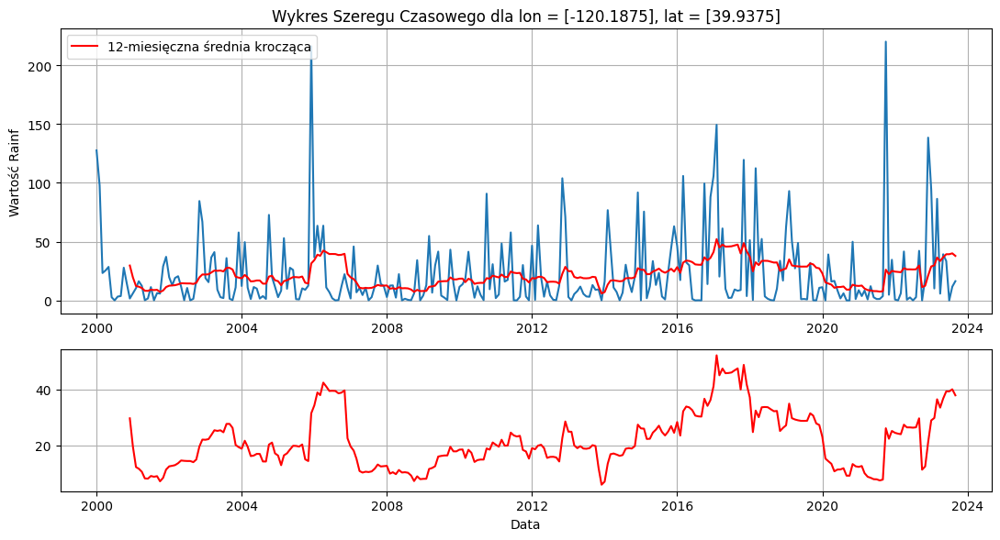

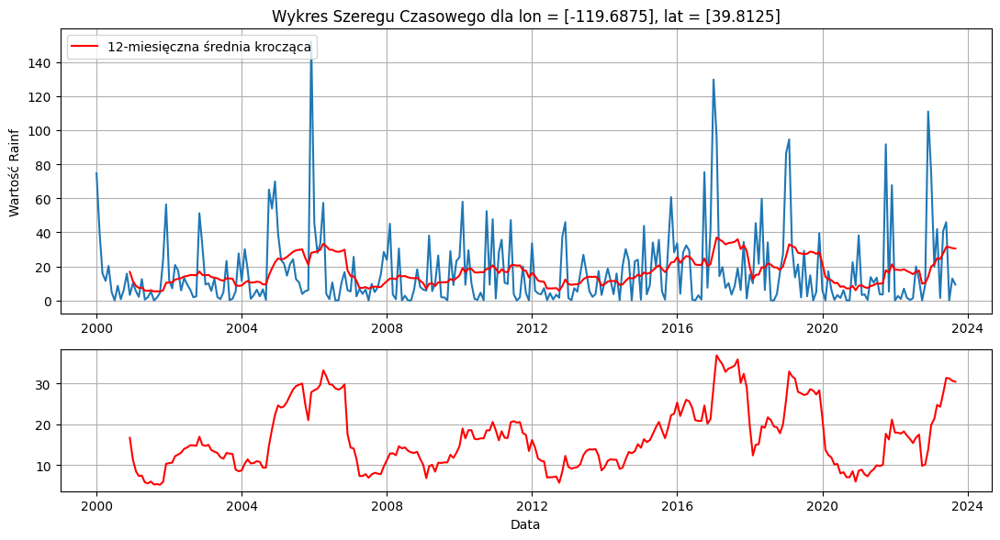

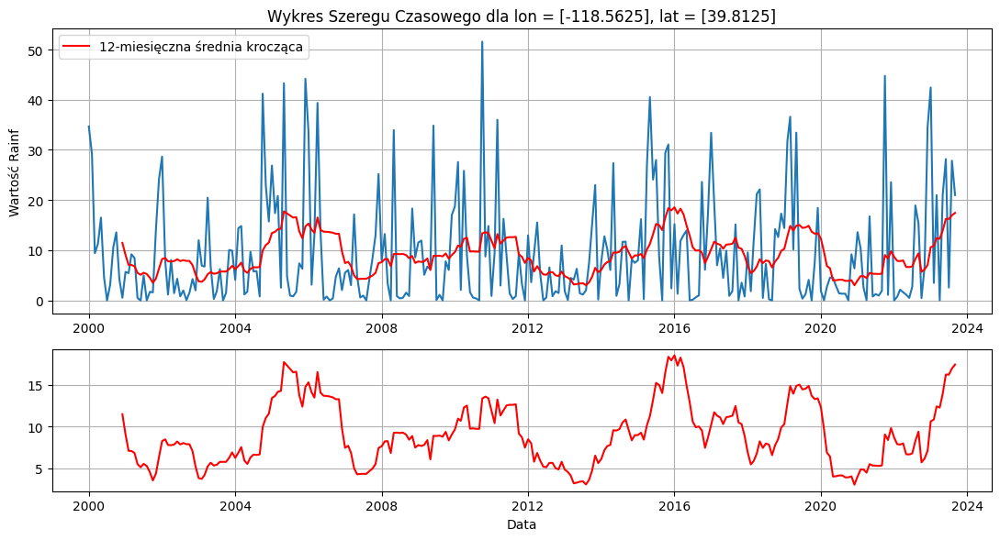

In [ ]:
Rainf_time_series_nie_pustynia = extract_time_series_from_dataframe(Rainf_SparkDataFrame, -120.1875, 39.9375)
Rainf_time_series_przejsciowe = extract_time_series_from_dataframe(Rainf_SparkDataFrame, -119.6875, 39.8125)
Rainf_time_series_pustynia = extract_time_series_from_dataframe(Rainf_SparkDataFrame, -118.5625, 39.8125)
plot_time_series(Rainf_time_series_nie_pustynia, 'Rainf')
plot_time_series(Rainf_time_series_przejsciowe, 'Rainf')
plot_time_series(Rainf_time_series_pustynia, 'Rainf')

Analiza dla obszaru niepustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(Rainf_time_series_nie_pustynia, 'Rainf', True)

ADF Statistic: -3.0745
p-value: 0.1124
Critical Values:
1%, -3.993
5%, -3.427
10%, -3.137


'Non-stationary'

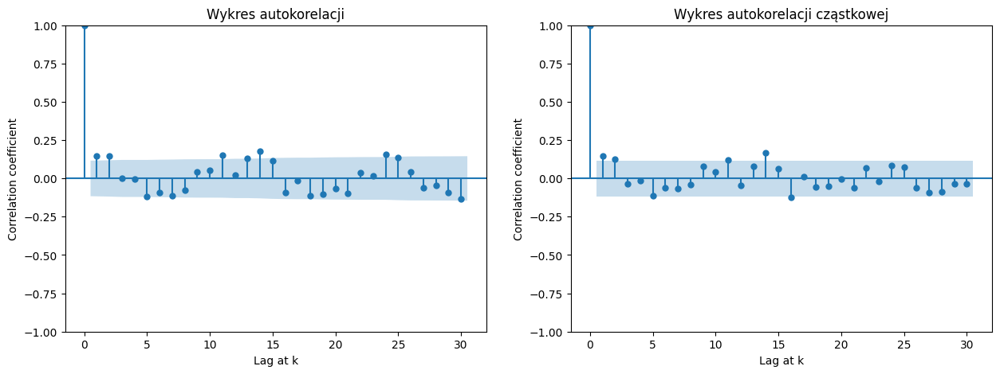

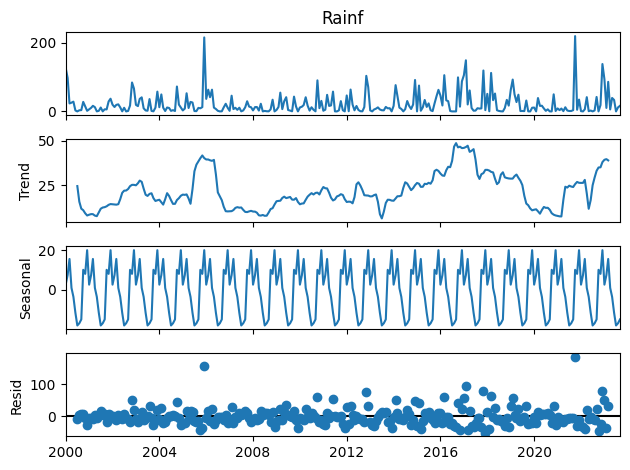

In [ ]:
plot_acf_and_pacf(Rainf_time_series_nie_pustynia, "Rainf", 30)
seasonal_decompose(Rainf_time_series_nie_pustynia['Rainf'], model="additive", period=12).plot().show()

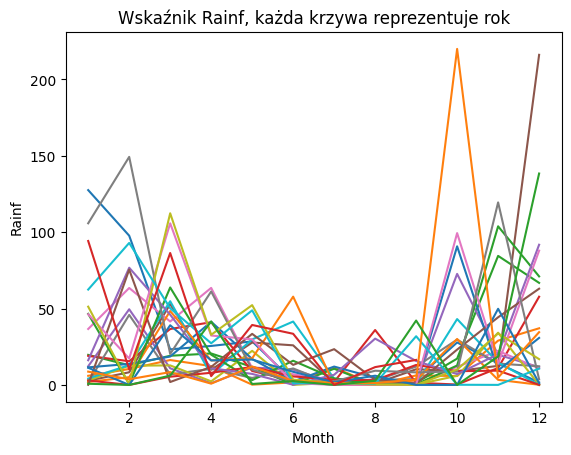

Mean squared error: 1536.324
Coefficient of determination: 0.078


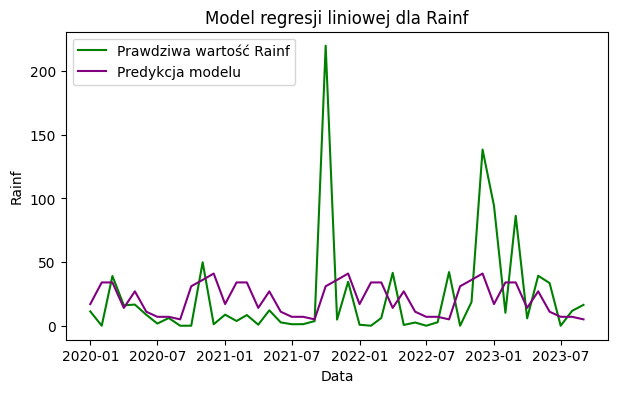

In [ ]:
plot_variable_to_check_yearly_seasonality(Rainf_time_series_nie_pustynia, 'Rainf')
fit_linear_model_and_plot_predictions(Rainf_time_series_nie_pustynia, 'Rainf', 2020)

Wzór trendu liniowego: 0.029644 * x + 18.055191
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 0.000101 * x^3 + -0.008104 * x^2 + 0.095935 * x + 23.992318


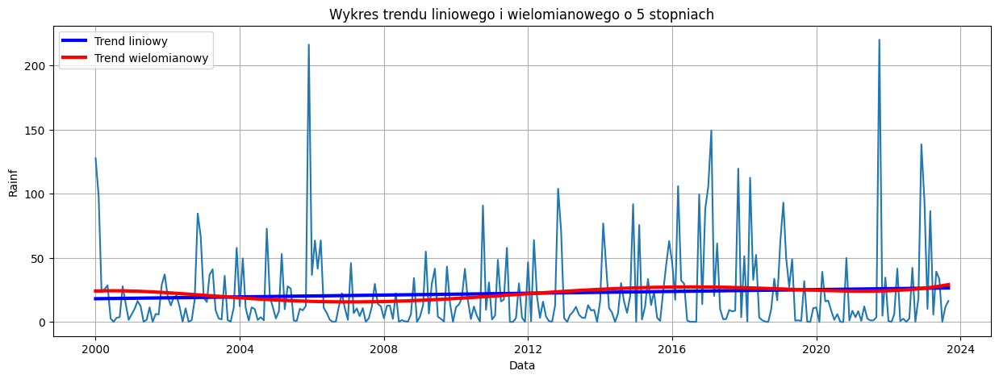

In [ ]:
plot_linear_and_polynomial_trend(Rainf_time_series_nie_pustynia, 'Rainf', 5)

Analiza dla obszaru przejściowego.

In [ ]:
perform_augumented_dickey_fuller_print_result(Rainf_time_series_przejsciowe, 'Rainf', True)

ADF Statistic: -13.1131
p-value: 0.0
Critical Values:
1%, -3.991
5%, -3.426
10%, -3.136


'Stationary'

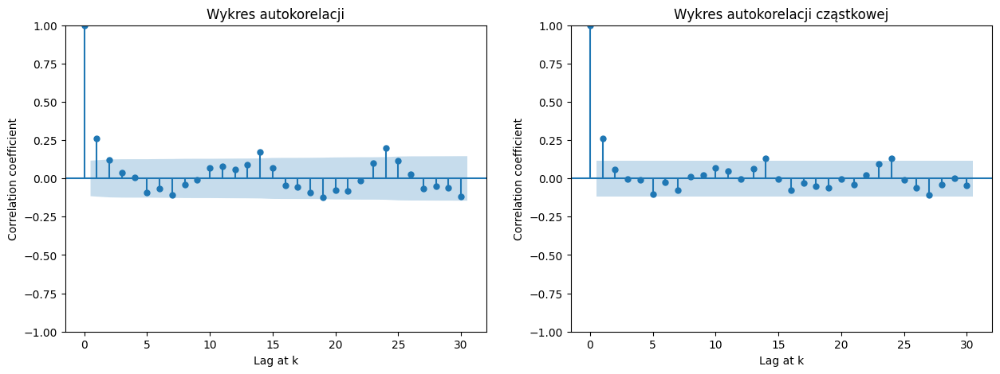

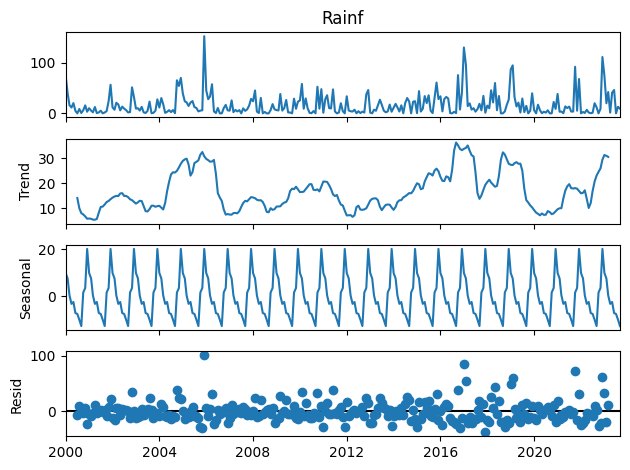

In [ ]:
plot_acf_and_pacf(Rainf_time_series_przejsciowe, "Rainf", 30)
seasonal_decompose(Rainf_time_series_przejsciowe['Rainf'], model="additive", period=12).plot().show()

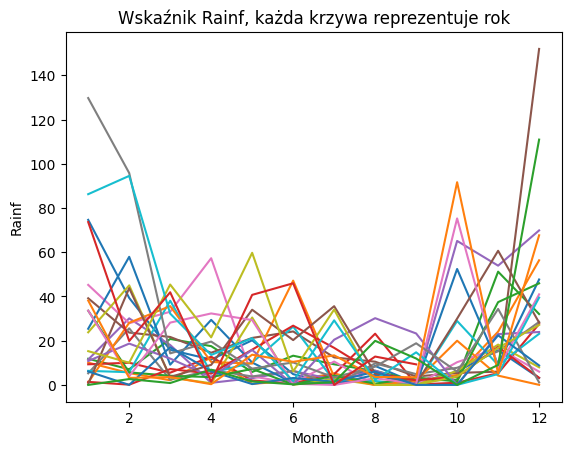

Mean squared error: 539.139
Coefficient of determination: 0.149


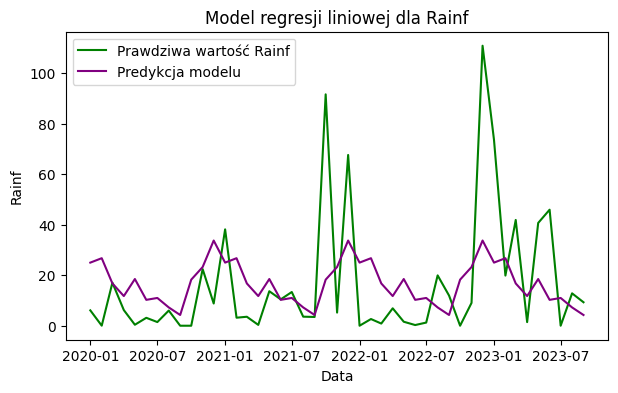

In [ ]:
plot_variable_to_check_yearly_seasonality(Rainf_time_series_przejsciowe, 'Rainf')
fit_linear_model_and_plot_predictions(Rainf_time_series_przejsciowe, 'Rainf', 2020)

Wzór trendu liniowego: 0.022219 * x + 13.902074
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 8.4e-05 * x^3 + -0.009686 * x^2 + 0.438309 * x + 10.20949


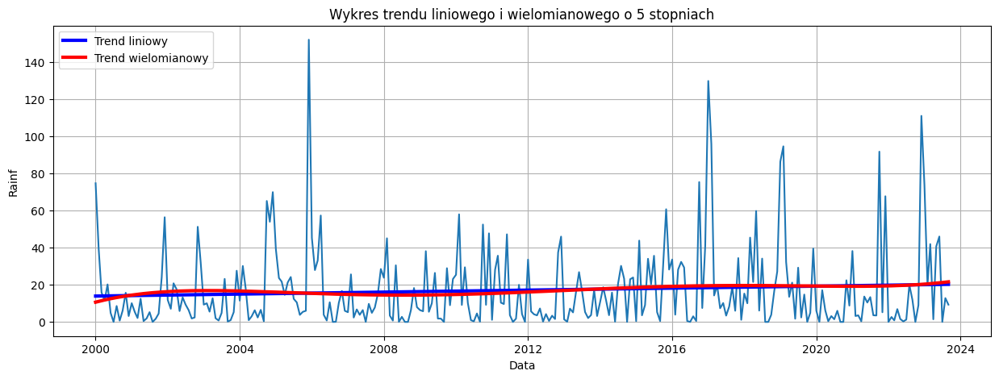

In [ ]:
plot_linear_and_polynomial_trend(Rainf_time_series_przejsciowe, 'Rainf', 5)

Analiza dla obszaru pustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(Rainf_time_series_pustynia, 'Rainf', True)

ADF Statistic: -13.9495
p-value: 0.0
Critical Values:
1%, -3.991
5%, -3.426
10%, -3.136


'Stationary'

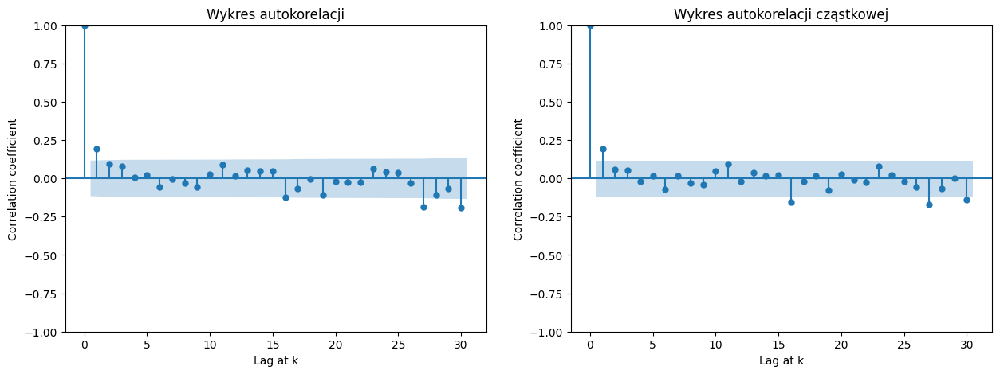

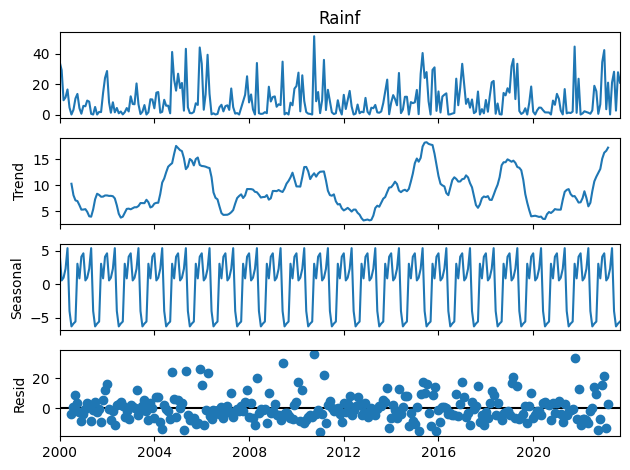

In [ ]:
plot_acf_and_pacf(Rainf_time_series_pustynia, "Rainf", 30)
seasonal_decompose(Rainf_time_series_pustynia['Rainf'], model="additive", period=12).plot().show()

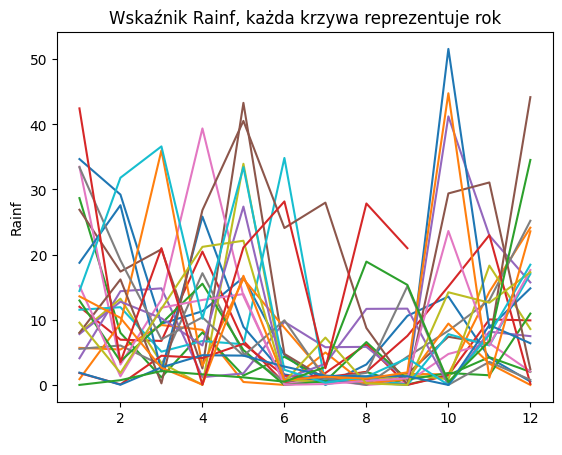

Mean squared error: 146.934
Coefficient of determination: -0.061


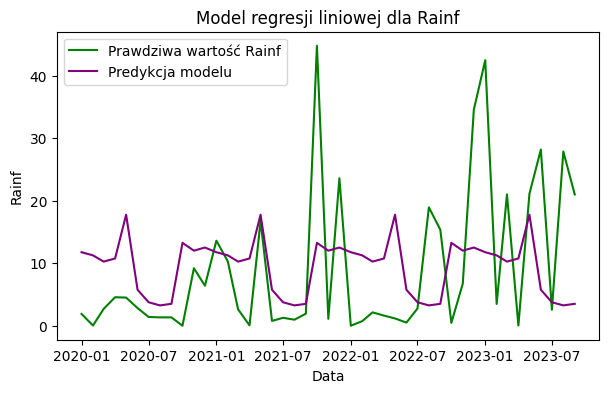

In [ ]:
plot_variable_to_check_yearly_seasonality(Rainf_time_series_pustynia, 'Rainf')
fit_linear_model_and_plot_predictions(Rainf_time_series_pustynia, 'Rainf', 2020)

Wzór trendu liniowego: 0.005608 * x + 8.616693
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 2.4e-05 * x^3 + -0.001621 * x^2 + 0.024505 * x + 9.170726


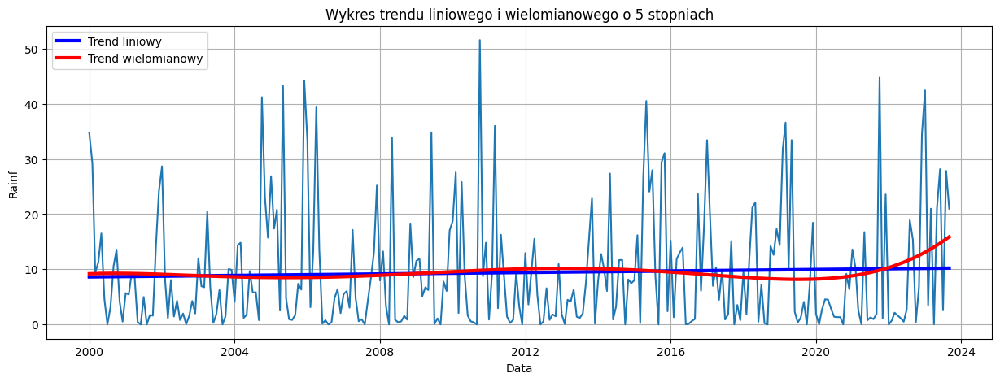

In [ ]:
plot_linear_and_polynomial_trend(Rainf_time_series_pustynia, 'Rainf', 5)

## **Evap** (wskaźnik całkowitej ewapotranspiracji)

In [30]:
#Pomiaru zawsze na 1 dzień miesiąca
Evap_SparkDataFrame = spark.sql("""
                        SELECT
                        lon, lat, Year, Month,
                        to_date(CONCAT(Year, '-', Month, '-1')) as Date, Evap
                        FROM nasa_ym
                        order by lon, lat, Year, Month
                        """)

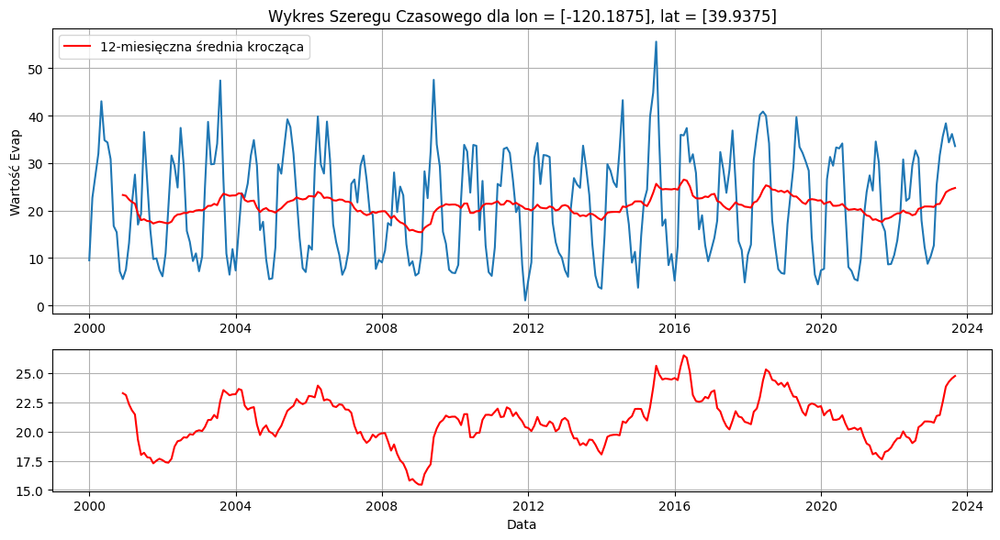

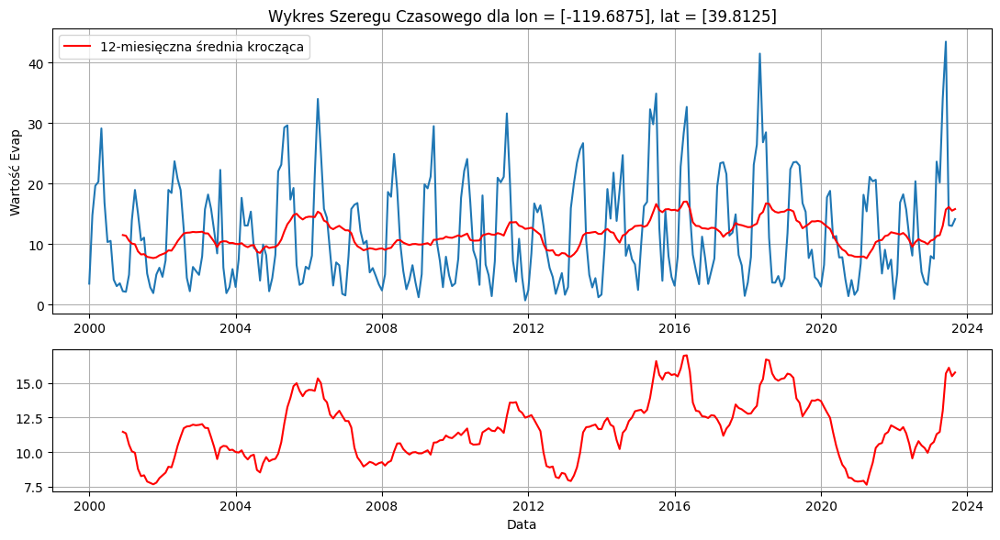

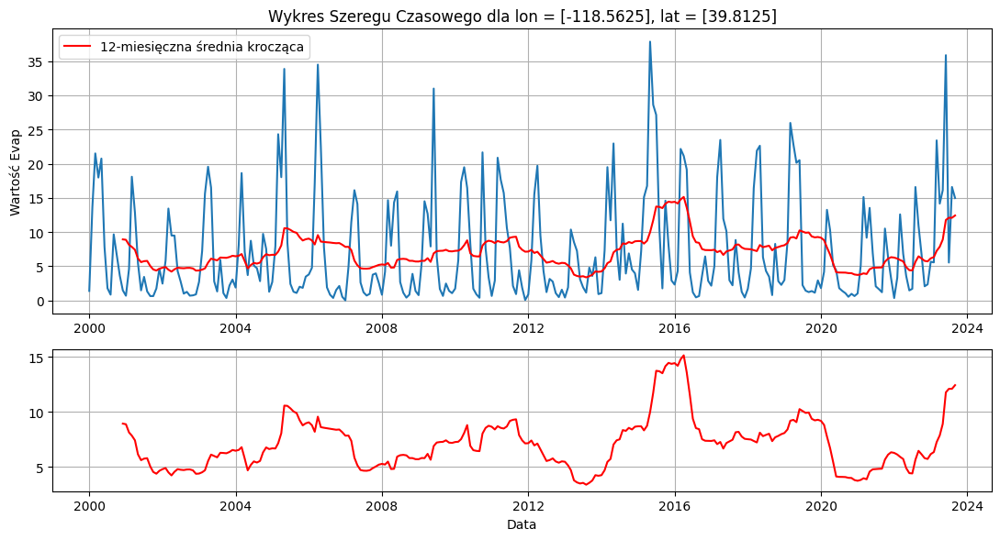

In [31]:
Evap_time_series_nie_pustynia = extract_time_series_from_dataframe(Evap_SparkDataFrame, -120.1875, 39.9375)
Evap_time_series_przejsciowe = extract_time_series_from_dataframe(Evap_SparkDataFrame, -119.6875, 39.8125)
Evap_time_series_pustynia = extract_time_series_from_dataframe(Evap_SparkDataFrame, -118.5625, 39.8125)
plot_time_series(Evap_time_series_nie_pustynia, 'Evap')
plot_time_series(Evap_time_series_przejsciowe, 'Evap')
plot_time_series(Evap_time_series_pustynia, 'Evap')

Analiza dla obszaru niepustynnego.

In [32]:
perform_augumented_dickey_fuller_print_result(Evap_time_series_nie_pustynia, 'Evap', True)

ADF Statistic: -3.2805
p-value: 0.0695
Critical Values:
1%, -3.992
5%, -3.427
10%, -3.137


'Non-stationary'

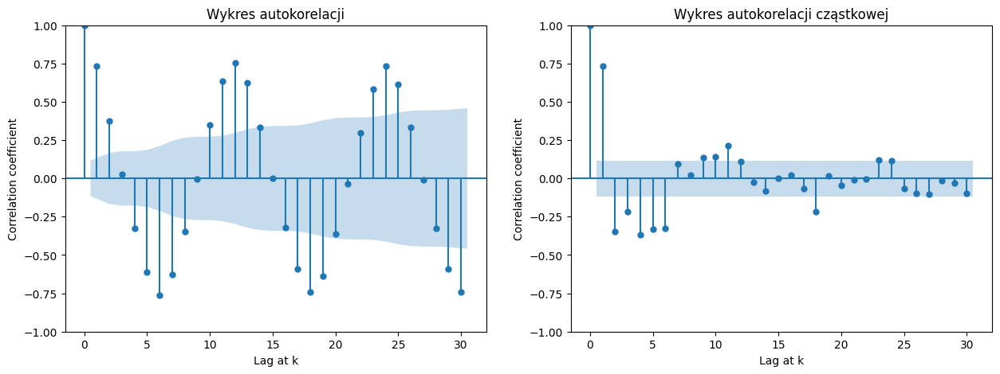

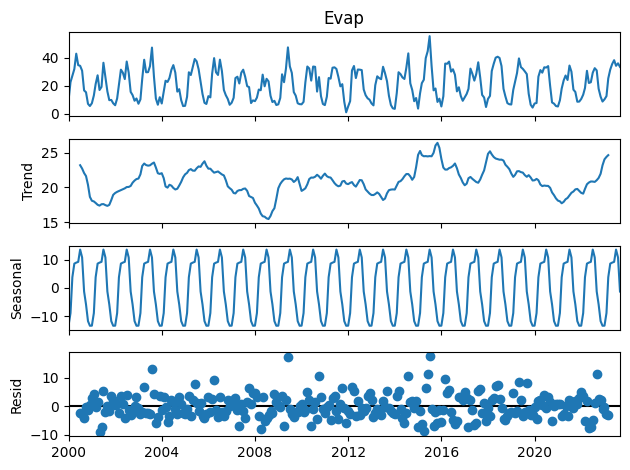

In [33]:
plot_acf_and_pacf(Evap_time_series_nie_pustynia, "Evap", 30)
seasonal_decompose(Evap_time_series_nie_pustynia['Evap'], model="additive", period=12).plot().show()

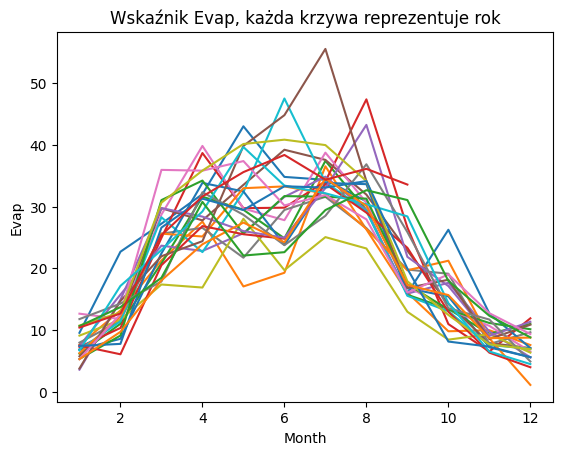

Mean squared error: 22.249
Coefficient of determination: 0.794


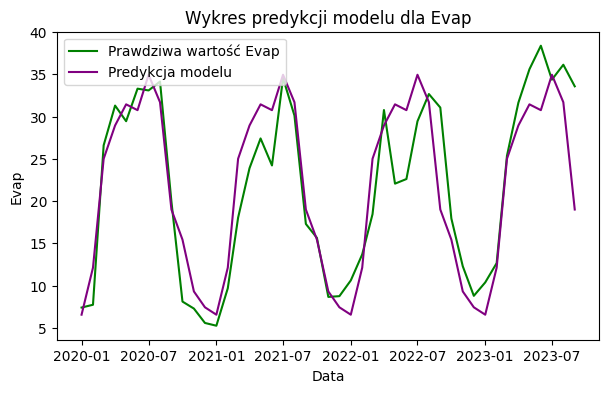

In [34]:
plot_variable_to_check_yearly_seasonality(Evap_time_series_nie_pustynia, 'Evap')
fit_linear_model_and_plot_predictions(Evap_time_series_nie_pustynia, 'Evap', 2020)

Wzór trendu liniowego: 0.006495 * x + 20.307907
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 6.6e-05 * x^3 + -0.006273 * x^2 + 0.199765 * x + 19.985798


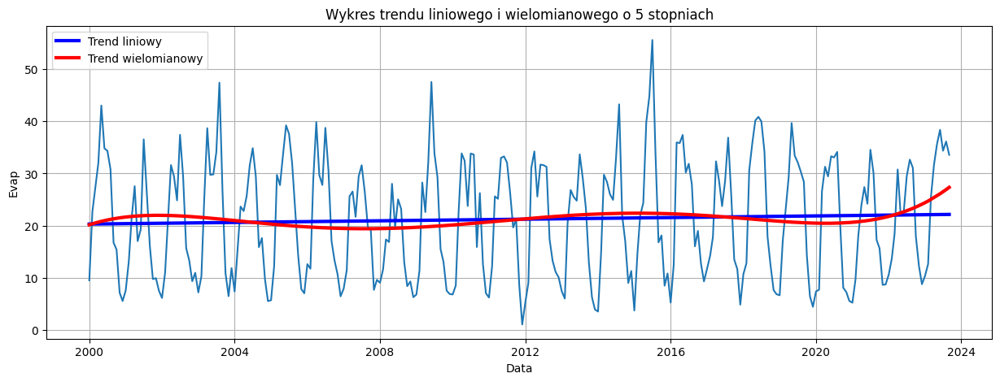

In [35]:
plot_linear_and_polynomial_trend(Evap_time_series_nie_pustynia, 'Evap', 5)

Analiza dla obszaru przejściowego.

In [ ]:
perform_augumented_dickey_fuller_print_result(Evap_time_series_przejsciowe, 'Evap', True)

ADF Statistic: -3.0775
p-value: 0.1117
Critical Values:
1%, -3.992
5%, -3.427
10%, -3.137


'Non-stationary'

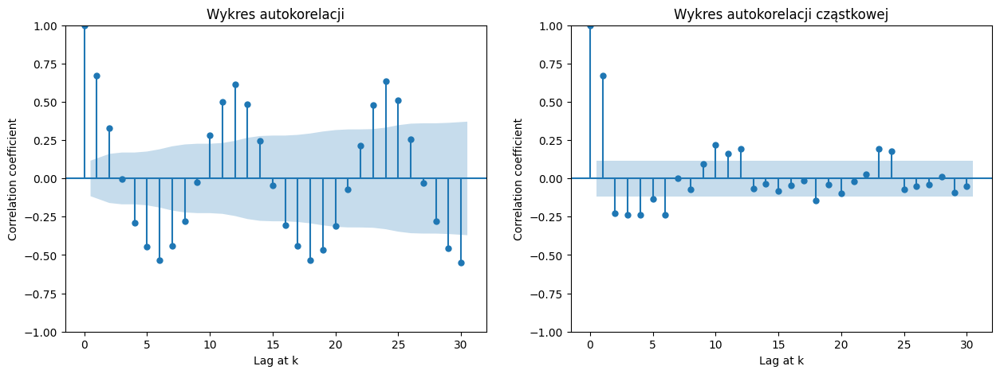

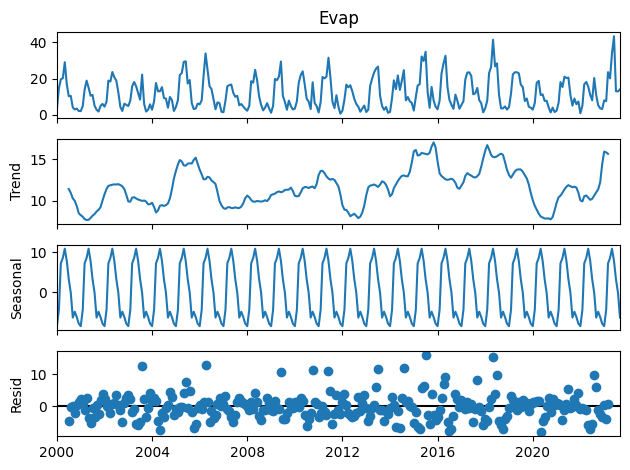

In [ ]:
plot_acf_and_pacf(Evap_time_series_przejsciowe, "Evap", 30)
seasonal_decompose(Evap_time_series_przejsciowe['Evap'], model="additive", period=12).plot().show()

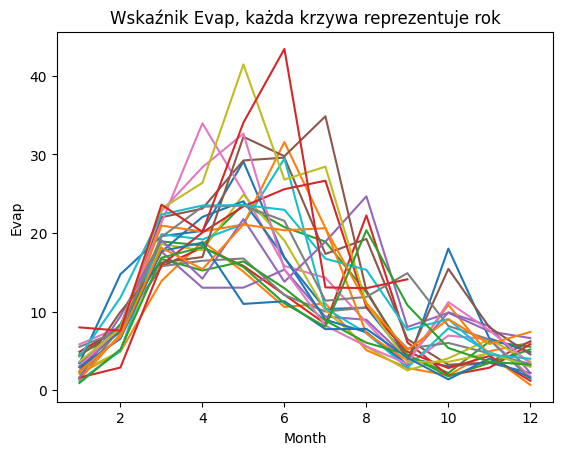

Mean squared error: 34.866
Coefficient of determination: 0.528


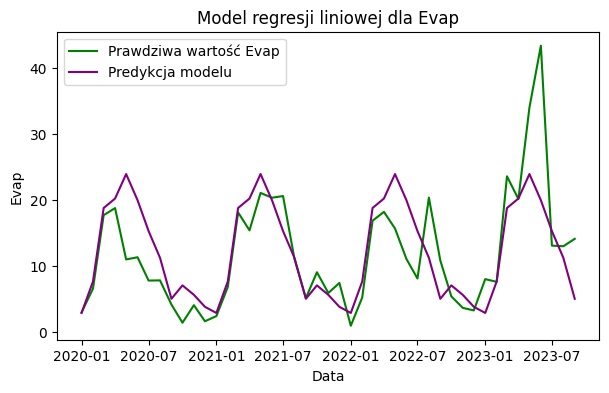

In [ ]:
plot_variable_to_check_yearly_seasonality(Evap_time_series_przejsciowe, 'Evap')
fit_linear_model_and_plot_predictions(Evap_time_series_przejsciowe, 'Evap', 2020)

Wzór trendu liniowego: 0.009914 * x + 10.373134
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 5.5e-05 * x^3 + -0.005283 * x^2 + 0.186318 * x + 9.368697


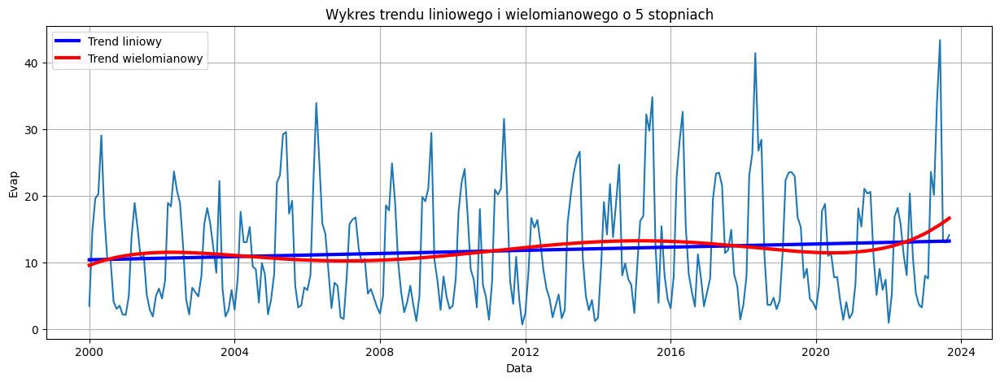

In [ ]:
plot_linear_and_polynomial_trend(Evap_time_series_przejsciowe, 'Evap', 5)

Analiza dla obszaru pustynnego.

In [36]:
perform_augumented_dickey_fuller_print_result(Evap_time_series_pustynia, 'Evap', True)

ADF Statistic: -2.6467
p-value: 0.2589
Critical Values:
1%, -3.992
5%, -3.427
10%, -3.137


'Non-stationary'

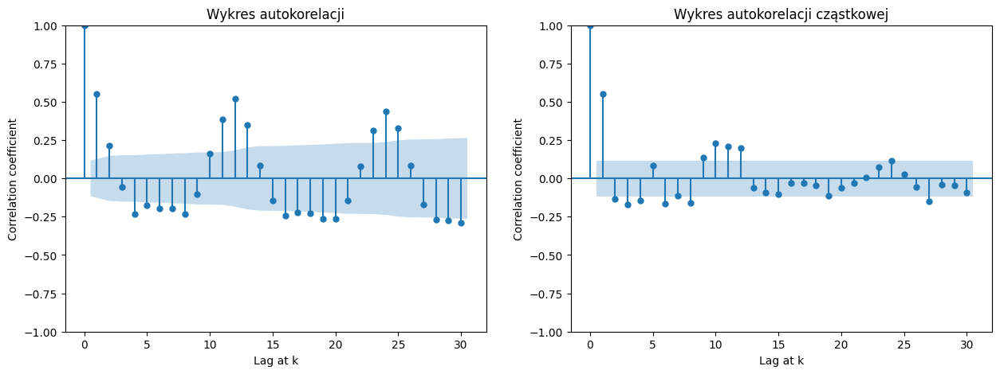

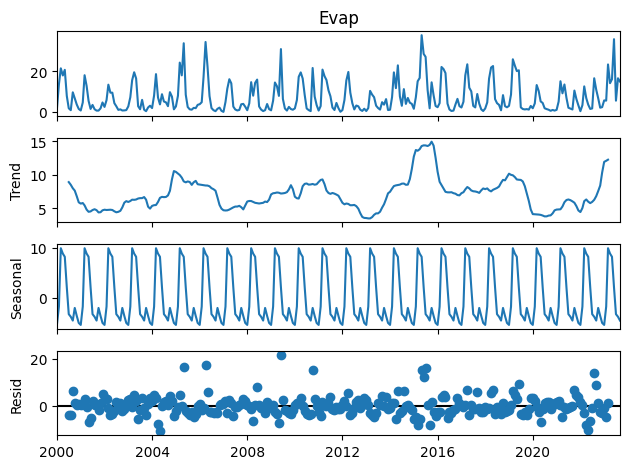

In [37]:
plot_acf_and_pacf(Evap_time_series_pustynia, "Evap", 30)
seasonal_decompose(Evap_time_series_pustynia['Evap'], model="additive", period=12).plot().show()

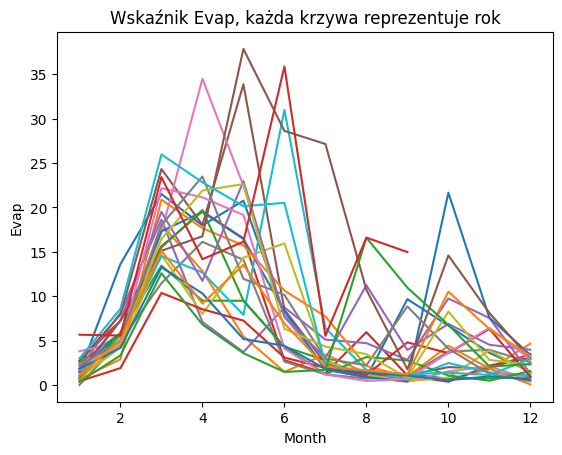

Mean squared error: 47.531
Coefficient of determination: 0.061


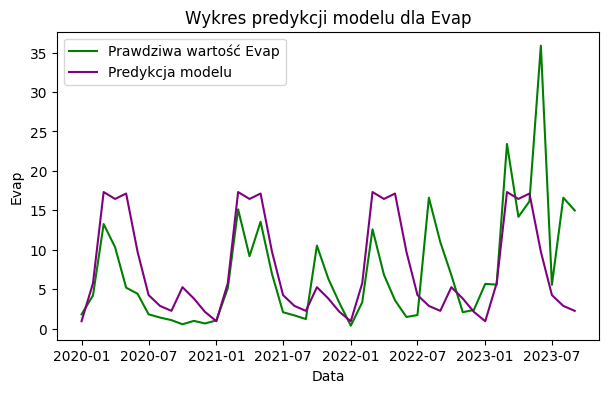

In [38]:
plot_variable_to_check_yearly_seasonality(Evap_time_series_pustynia, 'Evap')
fit_linear_model_and_plot_predictions(Evap_time_series_pustynia, 'Evap', 2020)

Mean squared error: 60.63
Coefficient of determination: -0.197


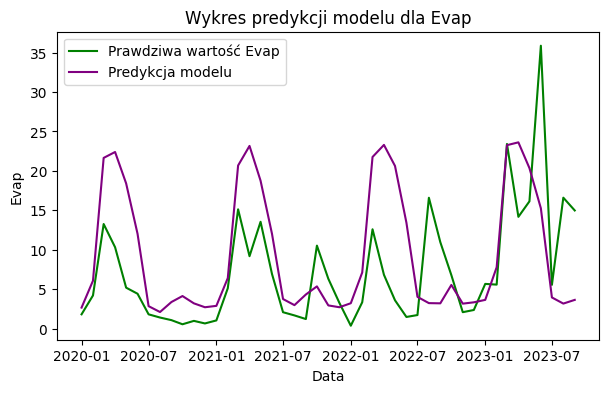

In [44]:
fit_sarima_and_plot_predictions(Evap_time_series_pustynia, 'Evap', 2020, 6,0,2, 3,1,0,12)

Wzór trendu liniowego: 0.006465 * x + 6.422164
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 4.2e-05 * x^3 + -0.003274 * x^2 + 0.070225 * x + 6.945417


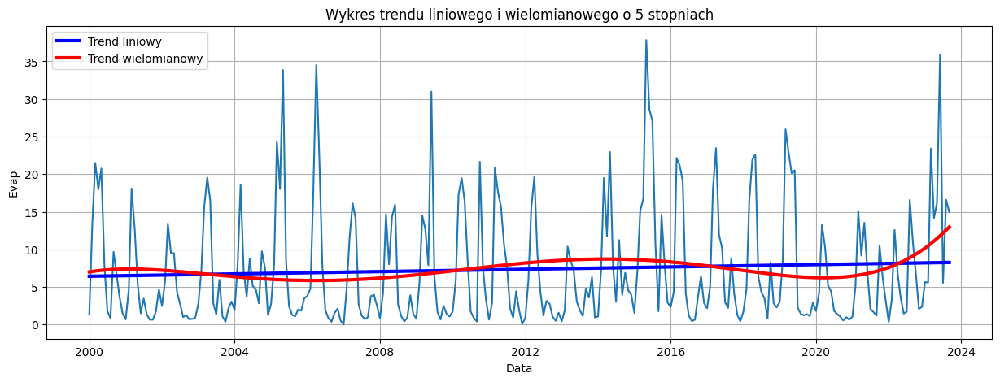

In [ ]:
plot_linear_and_polynomial_trend(Evap_time_series_pustynia, 'Evap', 5)

## **AvgSurfT** (wskaźnik średniej temperatury powierzchni ziemi)

In [ ]:
#Pomiaru zawsze na 1 dzień miesiąca
AvgSurfT_SparkDataFrame = spark.sql("""
                        SELECT
                        lon, lat, Year, Month,
                        to_date(CONCAT(Year, '-', Month, '-1')) as Date, AvgSurfT
                        FROM nasa_ym
                        order by lon, lat, Year, Month
                        """)

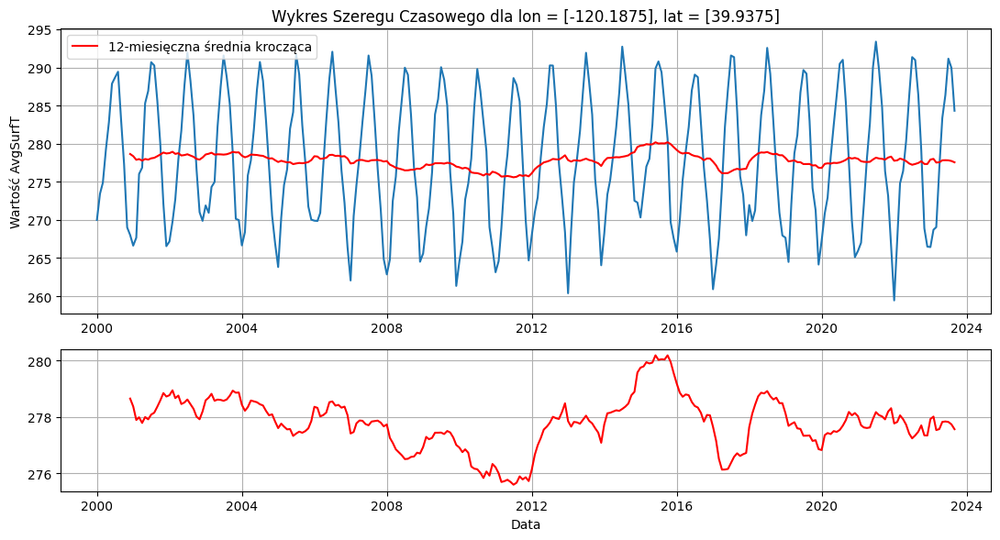

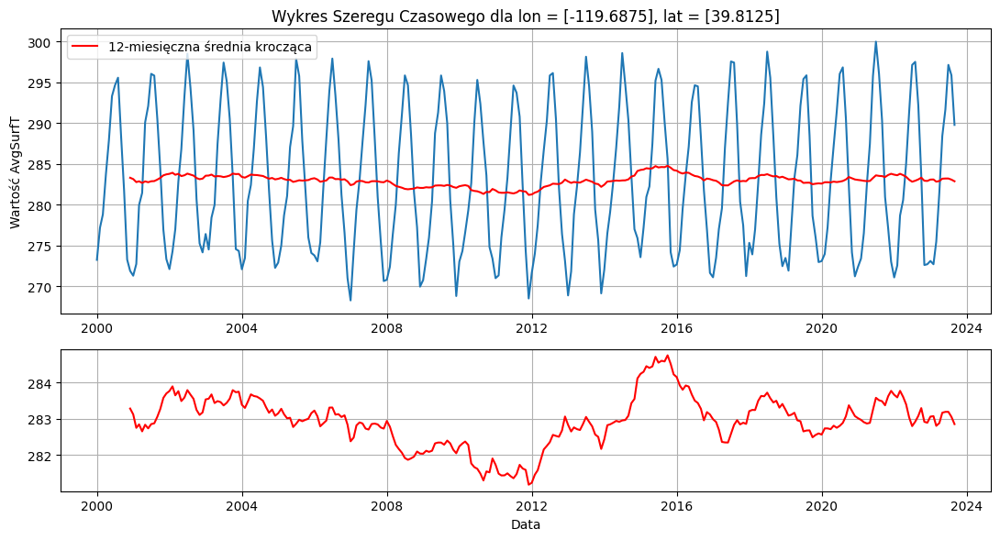

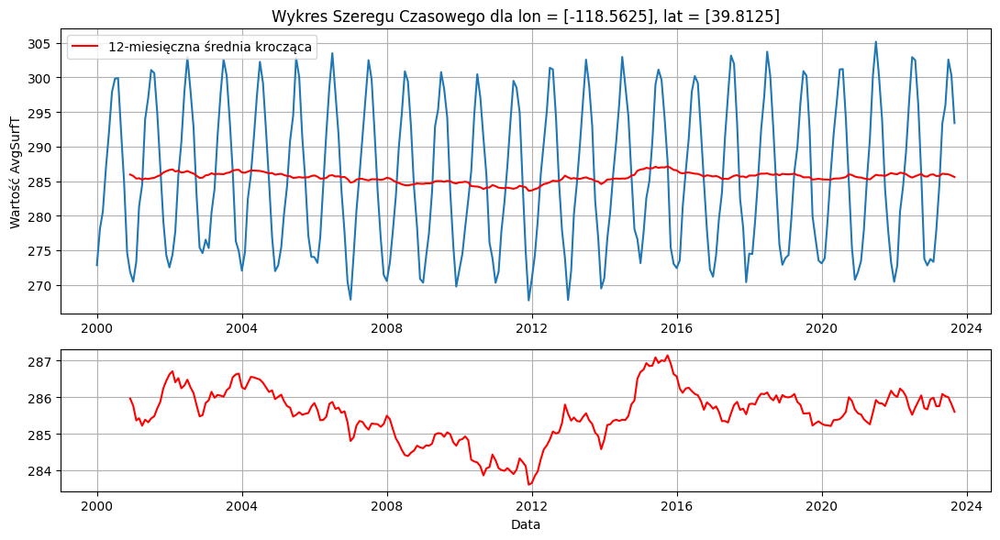

In [ ]:
AvgSurfT_time_series_nie_pustynia = extract_time_series_from_dataframe(AvgSurfT_SparkDataFrame, -120.1875, 39.9375)
AvgSurfT_time_series_przejsciowe = extract_time_series_from_dataframe(AvgSurfT_SparkDataFrame, -119.6875, 39.8125)
AvgSurfT_time_series_pustynia = extract_time_series_from_dataframe(AvgSurfT_SparkDataFrame, -118.5625, 39.8125)
plot_time_series(AvgSurfT_time_series_nie_pustynia, 'AvgSurfT')
plot_time_series(AvgSurfT_time_series_przejsciowe, 'AvgSurfT')
plot_time_series(AvgSurfT_time_series_pustynia, 'AvgSurfT')

Analiza dla obszaru niepustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(AvgSurfT_time_series_nie_pustynia, 'AvgSurfT', True)

ADF Statistic: -2.9854
p-value: 0.1362
Critical Values:
1%, -3.993
5%, -3.427
10%, -3.137


'Non-stationary'

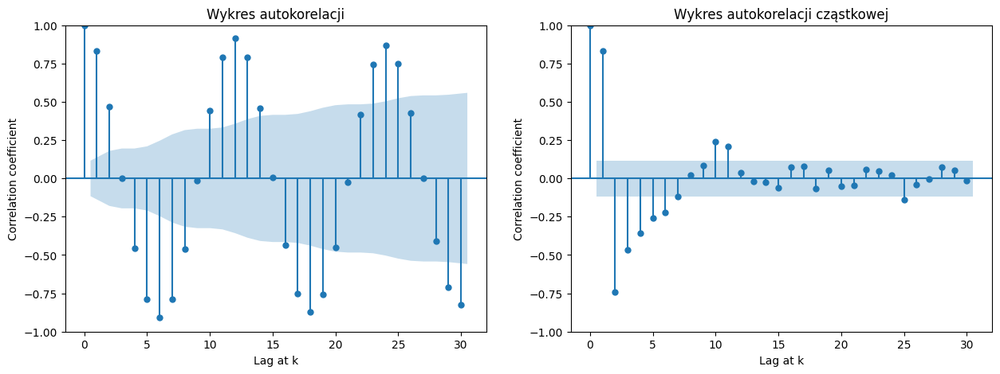

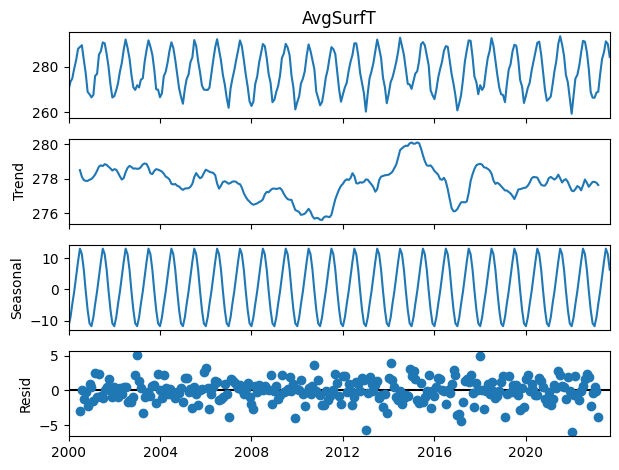

In [ ]:
plot_acf_and_pacf(AvgSurfT_time_series_nie_pustynia, "AvgSurfT", 30)
seasonal_decompose(AvgSurfT_time_series_nie_pustynia['AvgSurfT'], model="additive", period=12).plot().show()

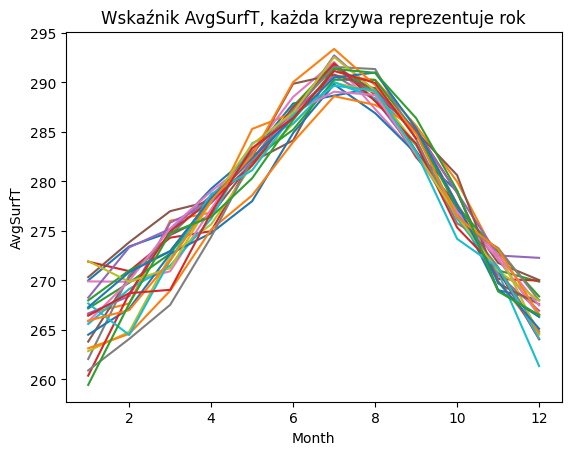

Mean squared error: 3.082
Coefficient of determination: 0.964


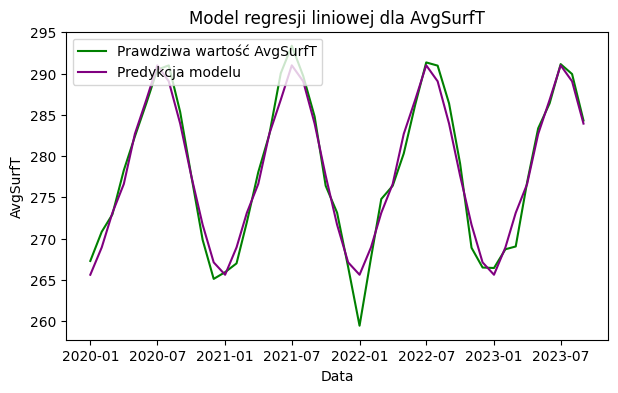

In [ ]:
plot_variable_to_check_yearly_seasonality(AvgSurfT_time_series_nie_pustynia, 'AvgSurfT')
fit_linear_model_and_plot_predictions(AvgSurfT_time_series_nie_pustynia, 'AvgSurfT', 2020)

Wzór trendu liniowego: 0.000501 * x + 277.813155
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 5.2e-05 * x^3 + -0.005371 * x^2 + 0.194586 * x + 276.82271


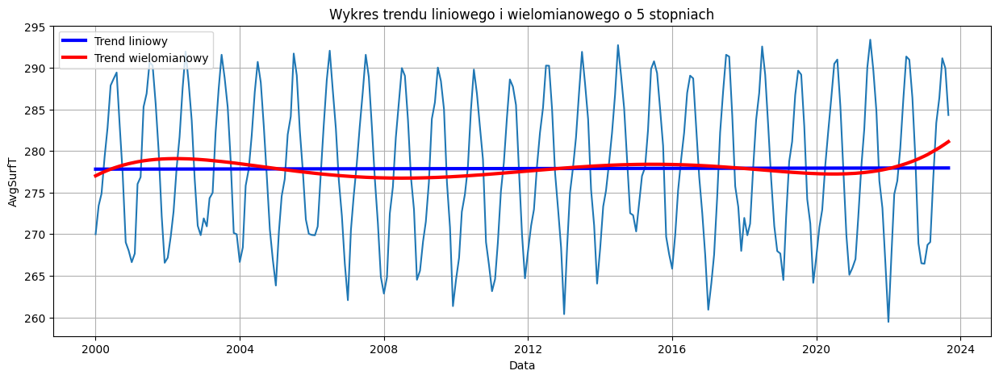

In [ ]:
plot_linear_and_polynomial_trend(AvgSurfT_time_series_nie_pustynia, 'AvgSurfT', 5)

Analiza dla obszaru przejściowego.

In [ ]:
perform_augumented_dickey_fuller_print_result(AvgSurfT_time_series_przejsciowe, 'AvgSurfT', True)

ADF Statistic: -2.2369
p-value: 0.4691
Critical Values:
1%, -3.992
5%, -3.427
10%, -3.137


'Non-stationary'

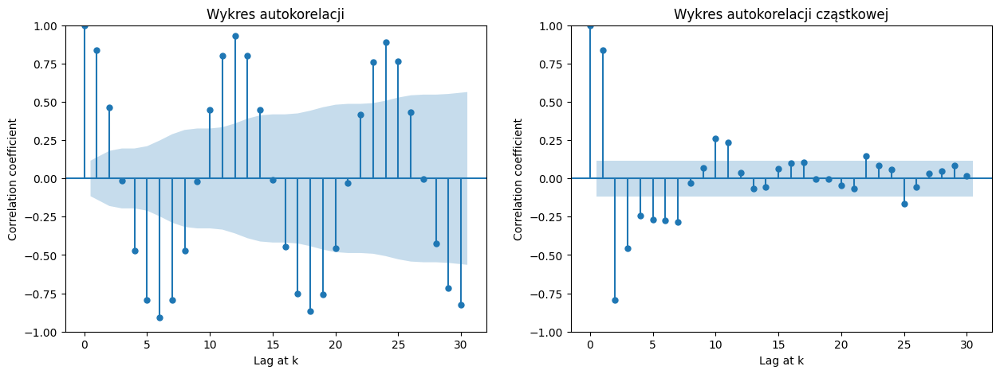

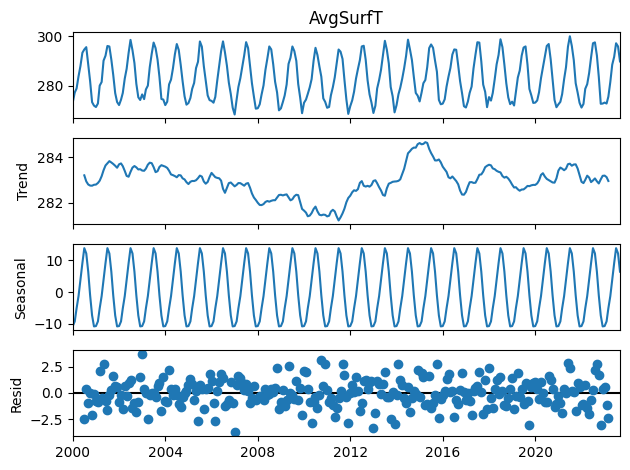

In [ ]:
plot_acf_and_pacf(AvgSurfT_time_series_przejsciowe, "AvgSurfT", 30)
seasonal_decompose(AvgSurfT_time_series_przejsciowe['AvgSurfT'], model="additive", period=12).plot().show()

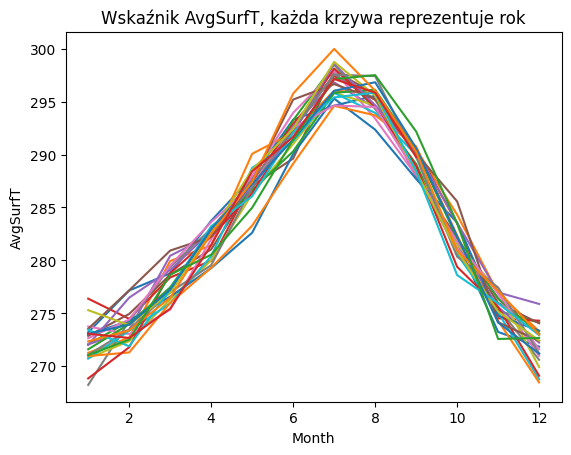

Mean squared error: 2.209
Coefficient of determination: 0.974


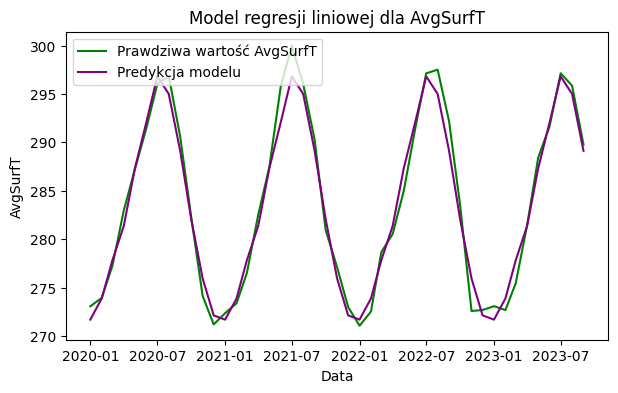

In [ ]:
plot_variable_to_check_yearly_seasonality(AvgSurfT_time_series_przejsciowe, 'AvgSurfT')
fit_linear_model_and_plot_predictions(AvgSurfT_time_series_przejsciowe, 'AvgSurfT', 2020)

Wzór trendu liniowego: 0.002228 * x + 282.713166
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 5.1e-05 * x^3 + -0.005457 * x^2 + 0.2121 * x + 281.364774


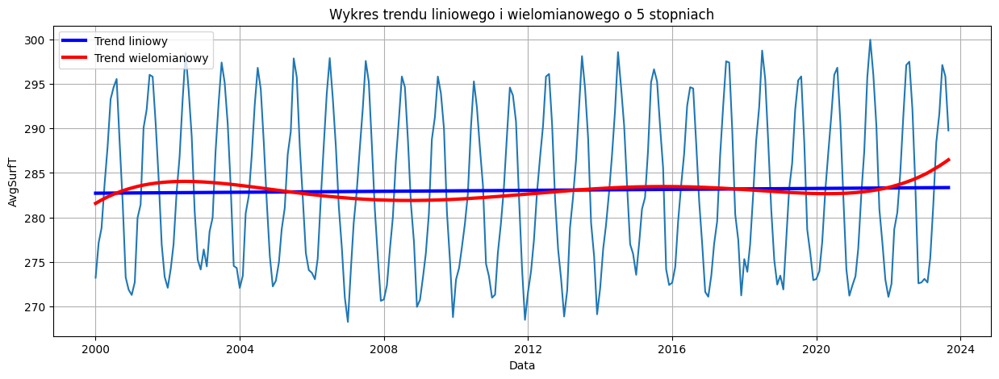

In [ ]:
plot_linear_and_polynomial_trend(AvgSurfT_time_series_przejsciowe, 'AvgSurfT', 5)

Analiza dla obszaru pustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(AvgSurfT_time_series_pustynia, 'AvgSurfT', True)

ADF Statistic: -2.244
p-value: 0.4651
Critical Values:
1%, -3.992
5%, -3.427
10%, -3.137


'Non-stationary'

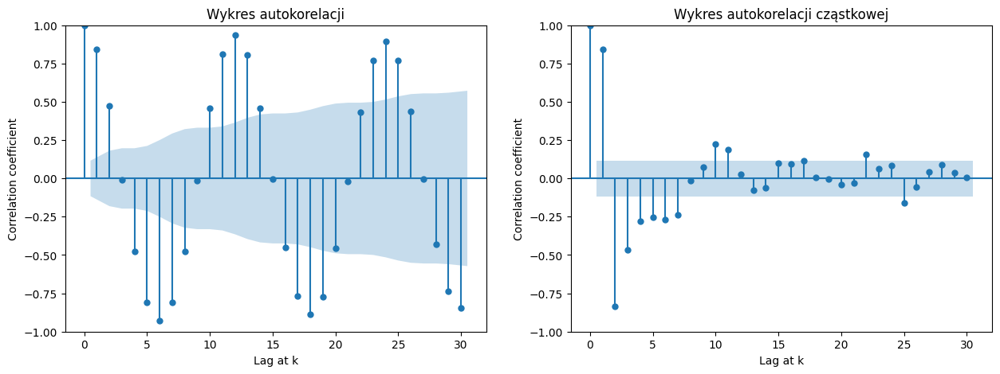

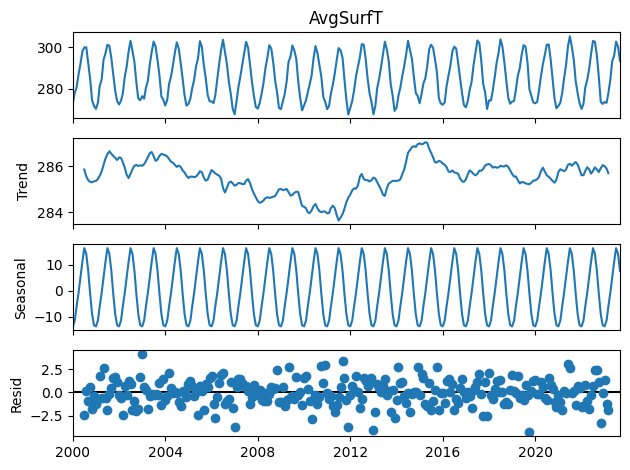

In [ ]:
plot_acf_and_pacf(AvgSurfT_time_series_pustynia, "AvgSurfT", 30)
seasonal_decompose(AvgSurfT_time_series_pustynia['AvgSurfT'], model="additive", period=12).plot().show()

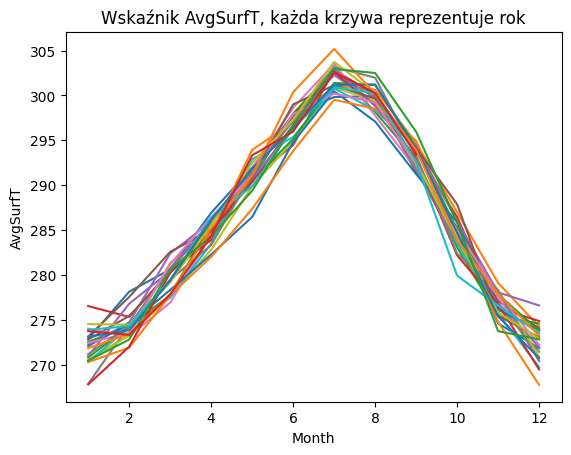

Mean squared error: 2.297
Coefficient of determination: 0.981


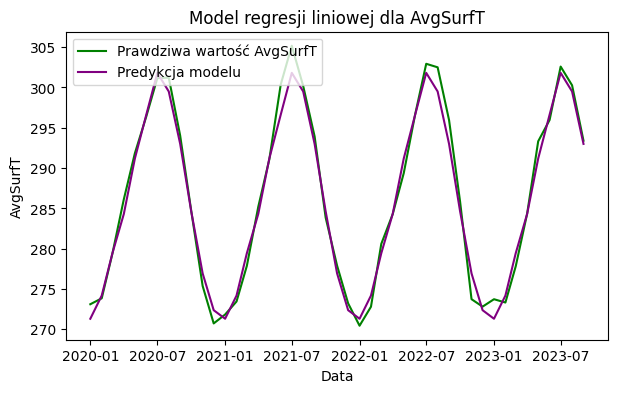

In [ ]:
plot_variable_to_check_yearly_seasonality(AvgSurfT_time_series_pustynia, 'AvgSurfT')
fit_linear_model_and_plot_predictions(AvgSurfT_time_series_pustynia, 'AvgSurfT', 2020)

Wzór trendu liniowego: 0.00262 * x + 285.270154
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 5.9e-05 * x^3 + -0.00635 * x^2 + 0.24988 * x + 283.611296


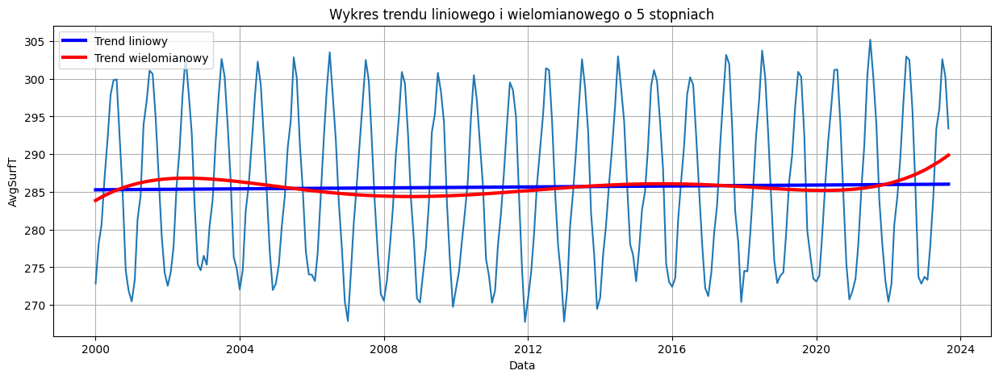

In [ ]:
plot_linear_and_polynomial_trend(AvgSurfT_time_series_pustynia, 'AvgSurfT', 5)

## **Albedo** (wskaźnik albedo)

In [ ]:
#Pomiaru zawsze na 1 dzień miesiąca
Albedo_SparkDataFrame = spark.sql("""
                        SELECT
                        lon, lat, Year, Month,
                        to_date(CONCAT(Year, '-', Month, '-1')) as Date, Albedo
                        FROM nasa_ym
                        order by lon, lat, Year, Month
                        """)

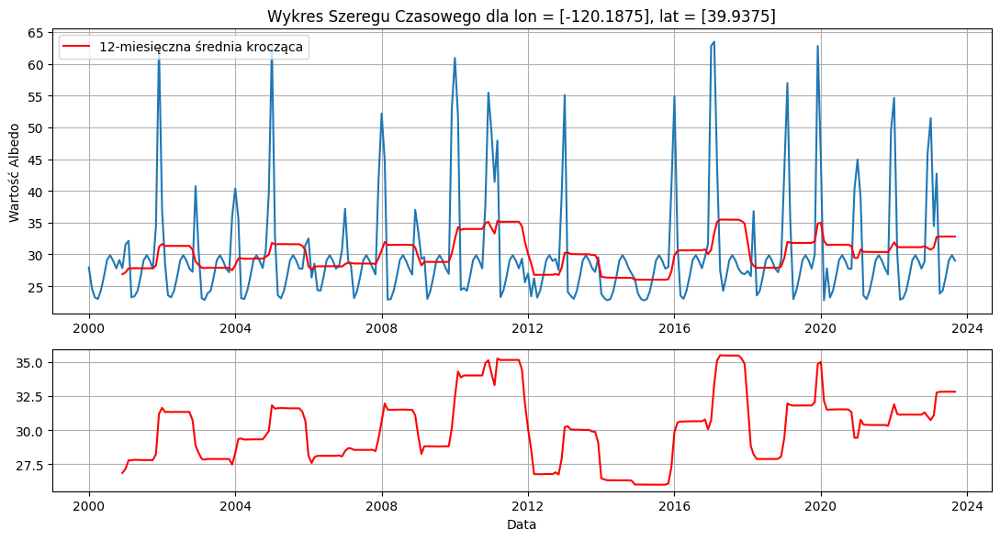

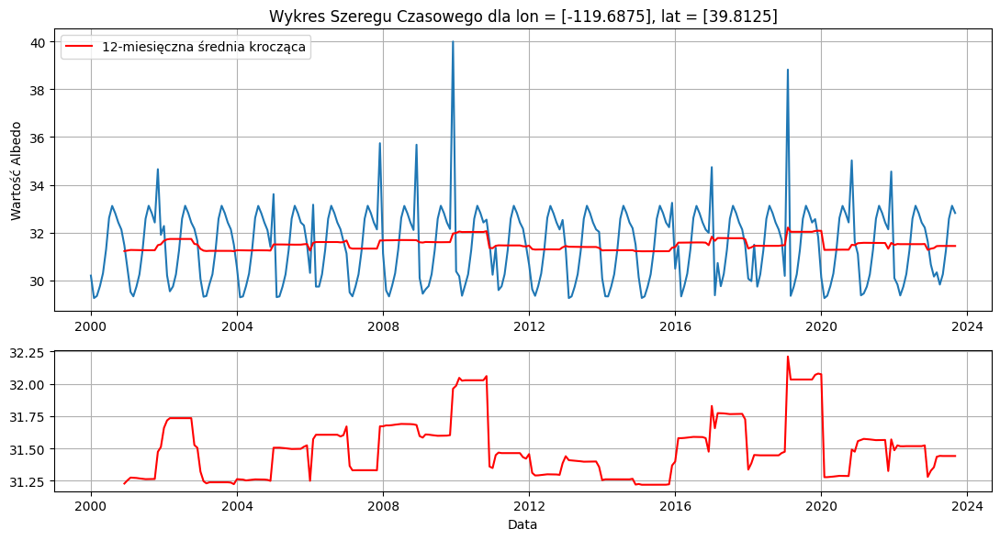

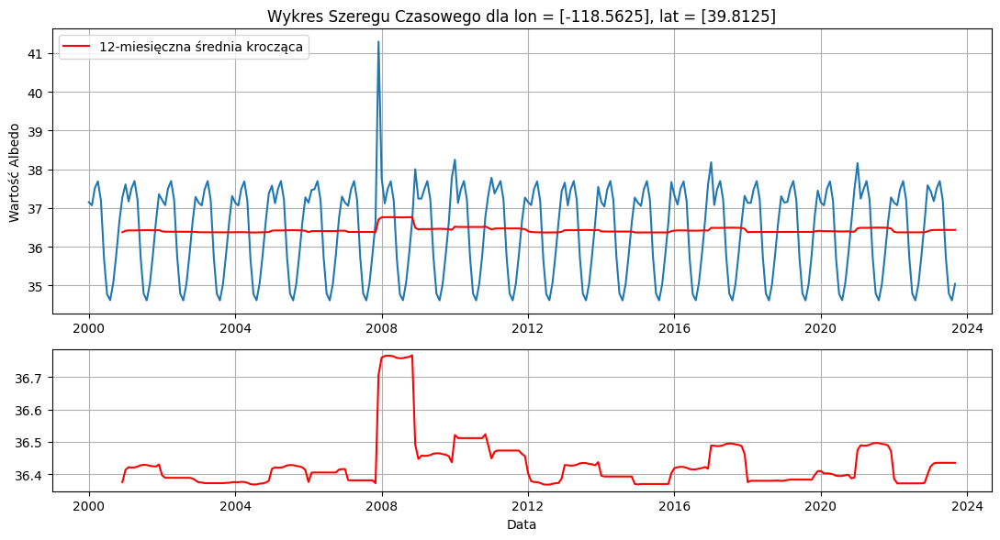

In [ ]:
Albedo_time_series_nie_pustynia = extract_time_series_from_dataframe(Albedo_SparkDataFrame, -120.1875, 39.9375)
Albedo_time_series_przejsciowe = extract_time_series_from_dataframe(Albedo_SparkDataFrame, -119.6875, 39.8125)
Albedo_time_series_pustynia = extract_time_series_from_dataframe(Albedo_SparkDataFrame, -118.5625, 39.8125)
plot_time_series(Albedo_time_series_nie_pustynia, 'Albedo')
plot_time_series(Albedo_time_series_przejsciowe, 'Albedo')
plot_time_series(Albedo_time_series_pustynia, 'Albedo')

Analiza dla obszaru niepustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(Albedo_time_series_nie_pustynia, 'Albedo', True)

ADF Statistic: -3.9098
p-value: 0.0118
Critical Values:
1%, -3.992
5%, -3.427
10%, -3.137


'Stationary'

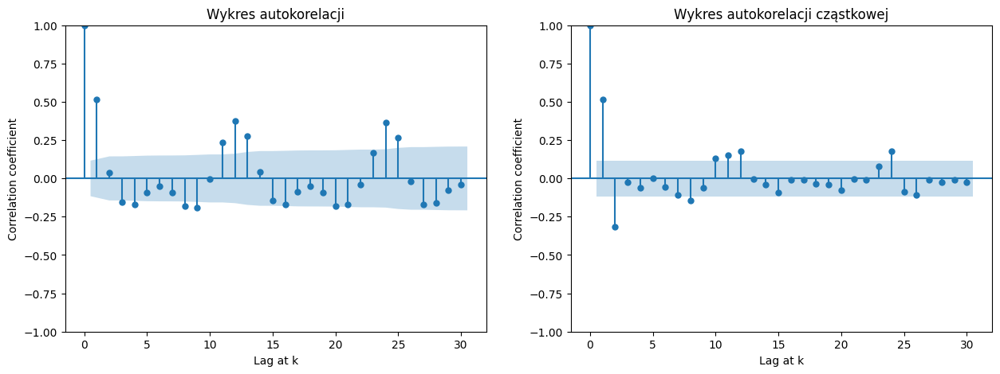

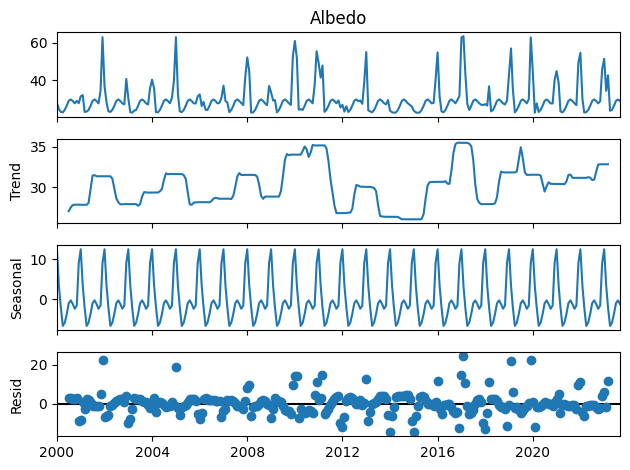

In [ ]:
plot_acf_and_pacf(Albedo_time_series_nie_pustynia, "Albedo", 30)
seasonal_decompose(Albedo_time_series_nie_pustynia['Albedo'], model="additive", period=12).plot().show()

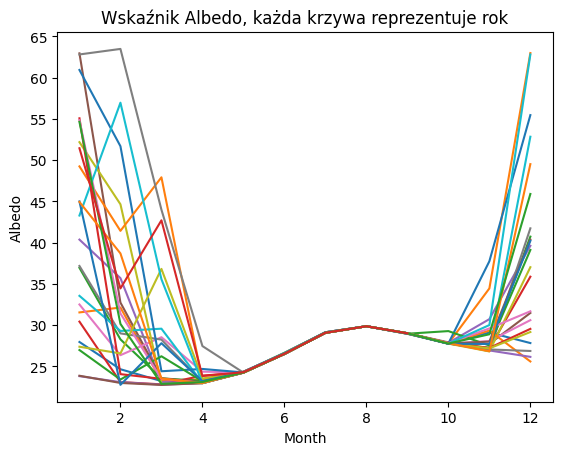

Mean squared error: 20.286
Coefficient of determination: 0.698


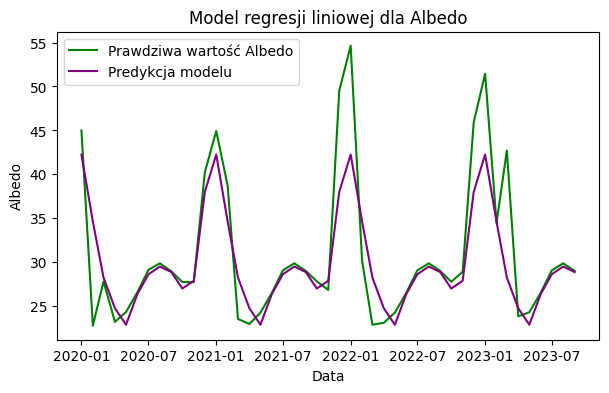

In [ ]:
plot_variable_to_check_yearly_seasonality(Albedo_time_series_nie_pustynia, 'Albedo')
fit_linear_model_and_plot_predictions(Albedo_time_series_nie_pustynia, 'Albedo', 2020)

Mean squared error: 30.895
Coefficient of determination: 0.54


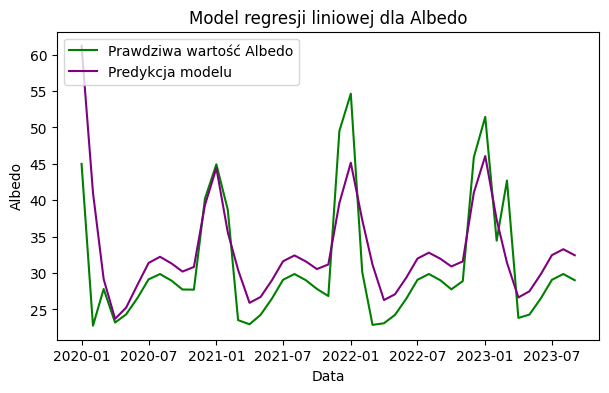

In [ ]:
fit_sarima_and_plot_predictions(Albedo_time_series_nie_pustynia, 'Albedo', 2020, 2,0,0, 3,1,2,12)

Wzór trendu liniowego: 0.008616 * x + 28.861012
Wzór trendu wielomianowego: -0.0 * x^5 + 0.0 * x^4 + -1.8e-05 * x^3 + 0.001198 * x^2 + 0.020462 * x + 27.51403


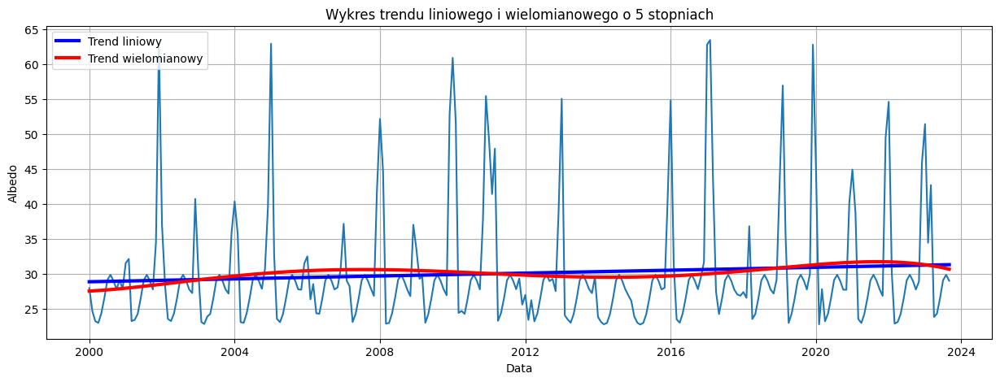

In [ ]:
plot_linear_and_polynomial_trend(Albedo_time_series_nie_pustynia, 'Albedo', 5)

Analiza dla obszaru przejściowego.

In [ ]:
perform_augumented_dickey_fuller_print_result(Albedo_time_series_przejsciowe, 'Albedo', True)

ADF Statistic: -3.8595
p-value: 0.0138
Critical Values:
1%, -3.992
5%, -3.427
10%, -3.137


'Stationary'

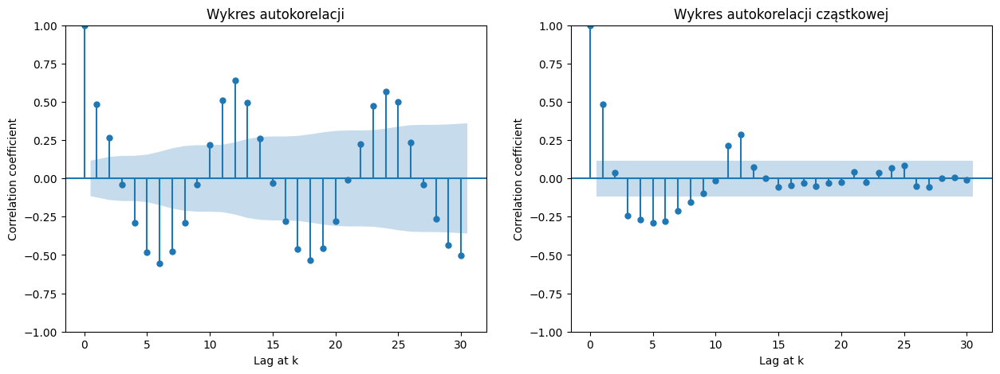

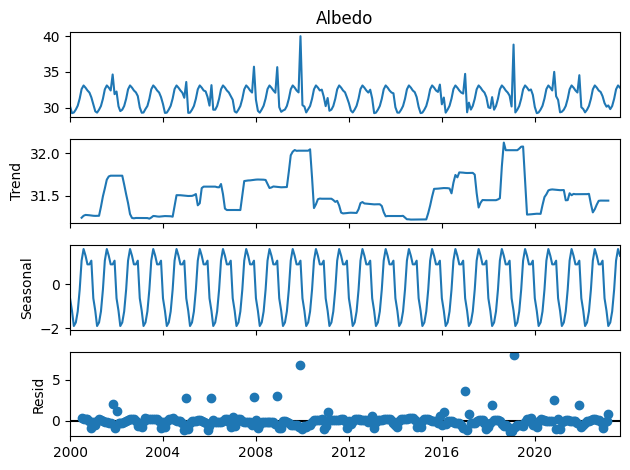

In [ ]:
plot_acf_and_pacf(Albedo_time_series_przejsciowe, "Albedo", 30)
seasonal_decompose(Albedo_time_series_przejsciowe['Albedo'], model="additive", period=12).plot().show()

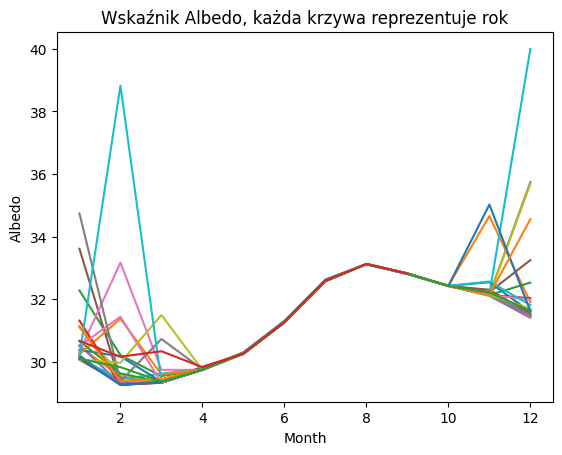

Mean squared error: 0.417
Coefficient of determination: 0.81


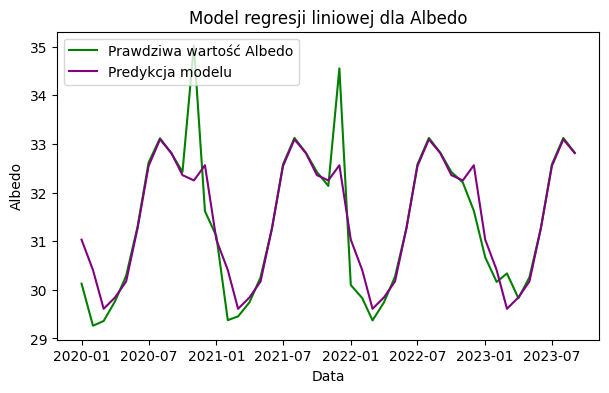

In [ ]:
plot_variable_to_check_yearly_seasonality(Albedo_time_series_przejsciowe, 'Albedo')
fit_linear_model_and_plot_predictions(Albedo_time_series_przejsciowe, 'Albedo', 2020)

Wzór trendu liniowego: 0.000792 * x + 31.371502
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 2e-06 * x^3 + -0.000342 * x^2 + 0.026688 * x + 30.84986


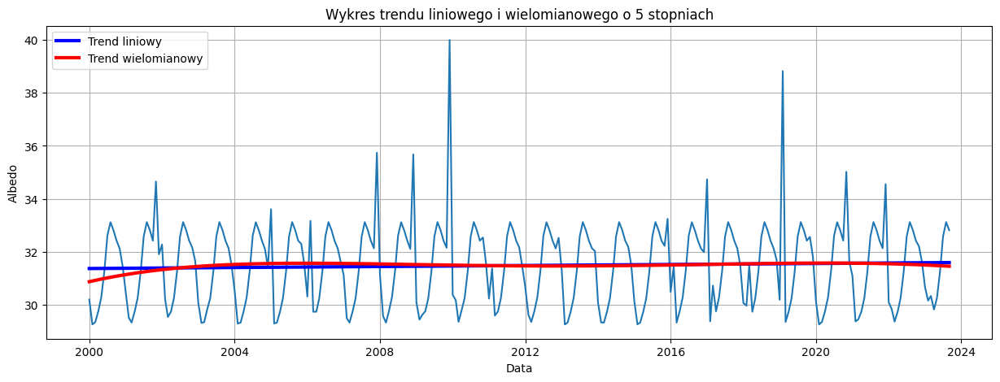

In [ ]:
plot_linear_and_polynomial_trend(Albedo_time_series_przejsciowe, 'Albedo', 5)

Analiza dla obszaru pustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(Albedo_time_series_pustynia, 'Albedo', True)

ADF Statistic: -3.585
p-value: 0.0311
Critical Values:
1%, -3.992
5%, -3.427
10%, -3.137


'Stationary'

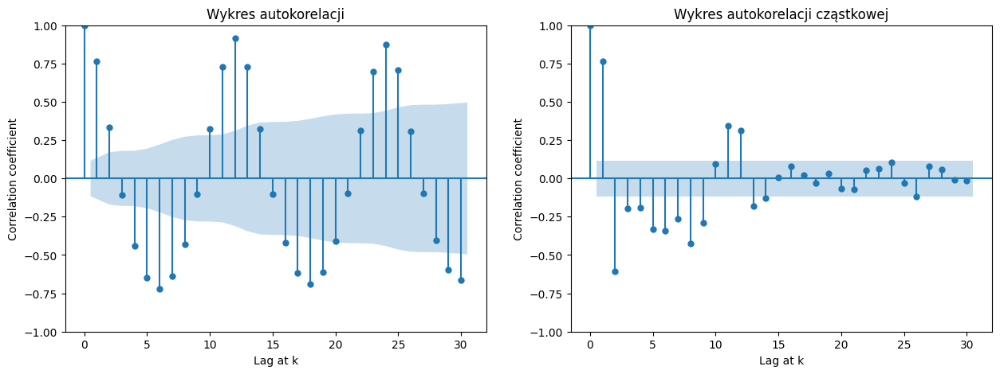

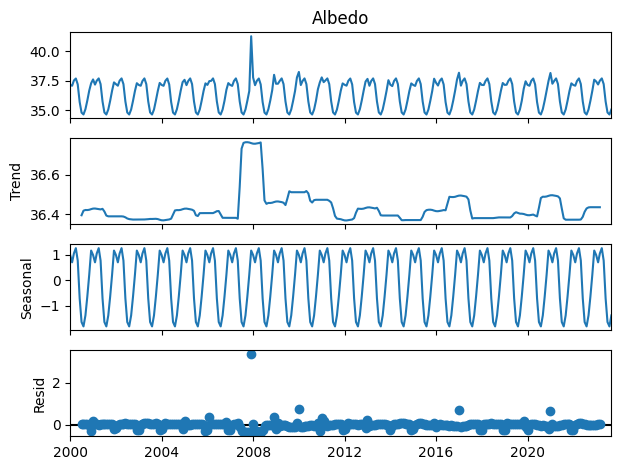

In [ ]:
plot_acf_and_pacf(Albedo_time_series_pustynia, "Albedo", 30)
seasonal_decompose(Albedo_time_series_pustynia['Albedo'], model="additive", period=12).plot().show()

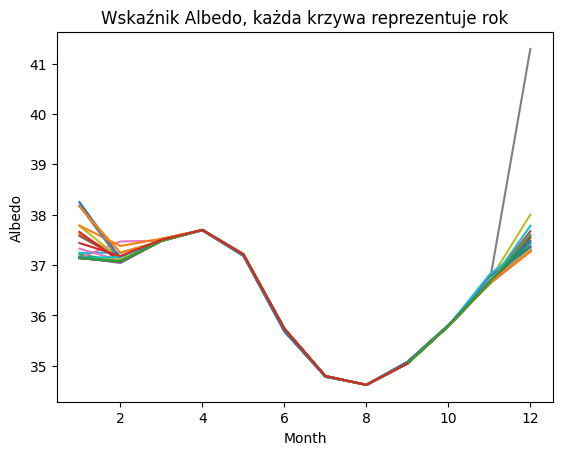

Mean squared error: 0.019
Coefficient of determination: 0.985


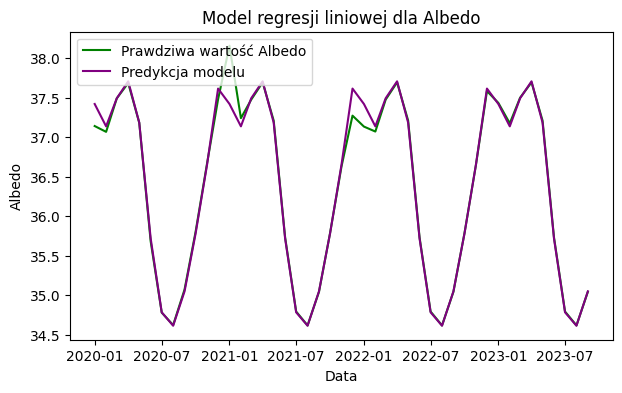

In [ ]:
plot_variable_to_check_yearly_seasonality(Albedo_time_series_pustynia, 'Albedo')
fit_linear_model_and_plot_predictions(Albedo_time_series_pustynia, 'Albedo', 2020)

Mean squared error: 0.031
Coefficient of determination: 0.976


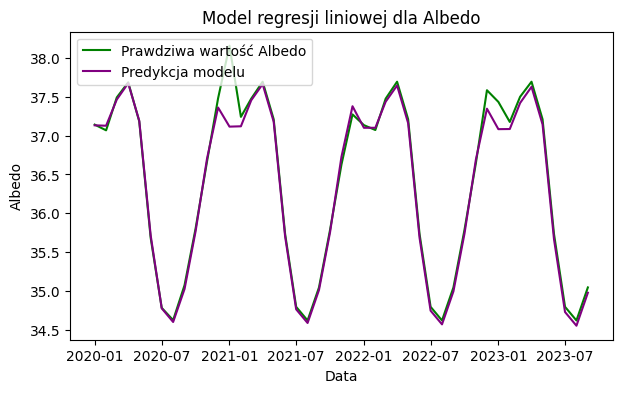

In [ ]:
fit_sarima_and_plot_predictions(Albedo_time_series_pustynia, 'Albedo', 2020, 1,0,0, 1,1,0,12)

Wzór trendu liniowego: -0.0003 * x + 36.470262
Wzór trendu wielomianowego: -0.0 * x^5 + 0.0 * x^4 + -6e-06 * x^3 + 0.000681 * x^2 + -0.02853 * x + 36.72816


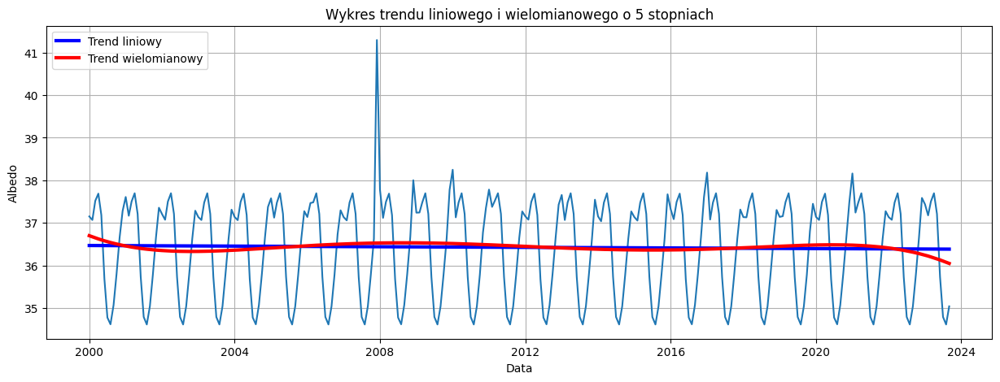

In [ ]:
plot_linear_and_polynomial_trend(Albedo_time_series_pustynia, 'Albedo', 5)

## **SoilM_40_100cm** (wskaźnik zawartości wody w warstwie o głębokości od 40 do 100 cm)

In [ ]:
#Pomiaru zawsze na 1 dzień miesiąca.
SoilM_40_100cm_SparkDataFrame = spark.sql("""
                        SELECT
                        lon, lat, Year, Month,
                        to_date(CONCAT(Year, '-', Month, '-1')) as Date, SoilM_40_100cm
                        FROM nasa_ym
                        order by lon, lat, Year, Month
                        """)

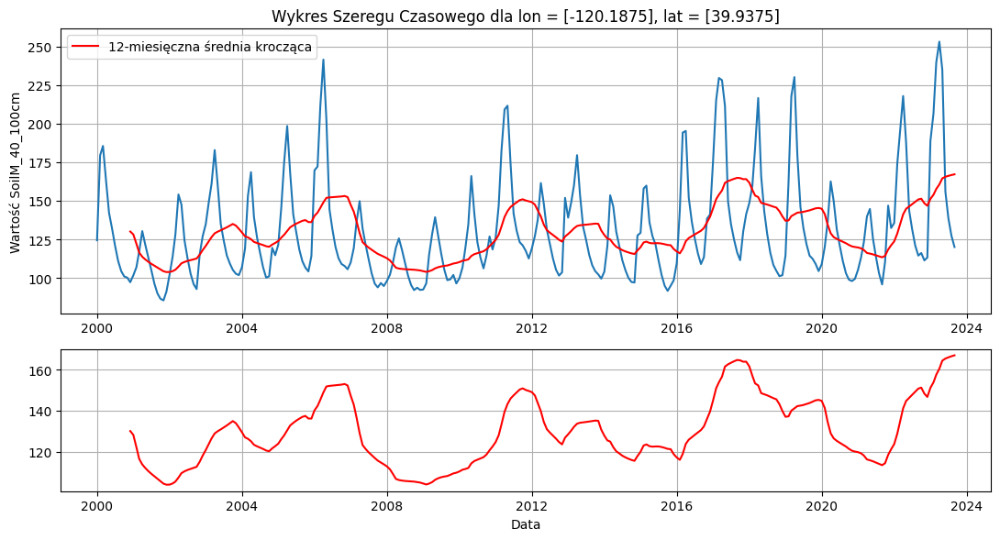

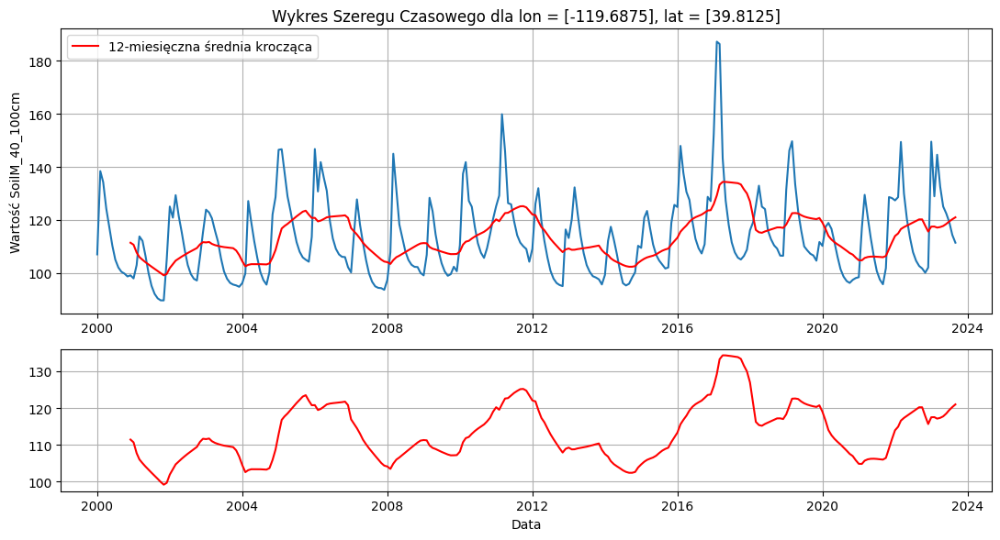

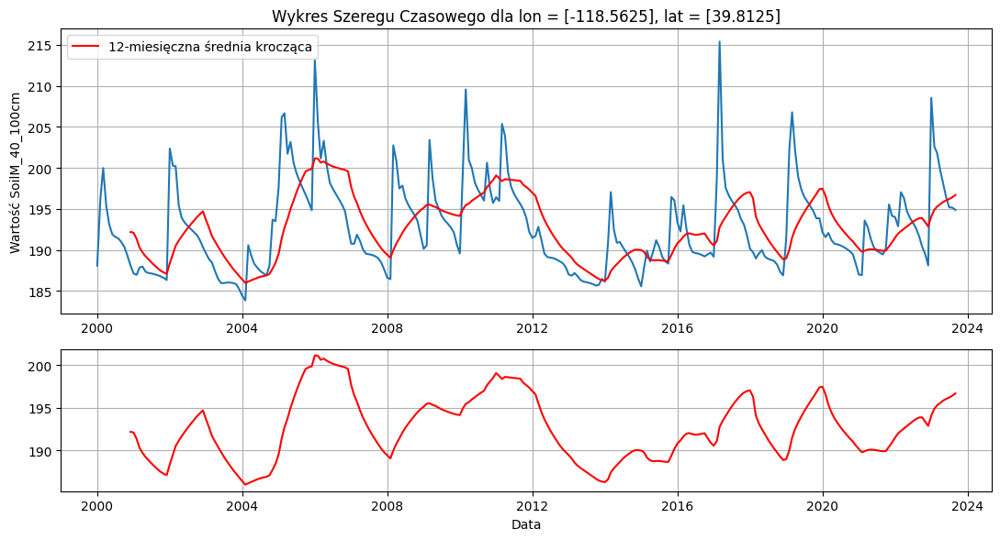

In [ ]:
SoilM_40_100cm_time_series_nie_pustynia = extract_time_series_from_dataframe(SoilM_40_100cm_SparkDataFrame, -120.1875, 39.9375)
SoilM_40_100cm_time_series_przejsciowe = extract_time_series_from_dataframe(SoilM_40_100cm_SparkDataFrame, -119.6875, 39.8125)
SoilM_40_100cm_time_series_pustynia = extract_time_series_from_dataframe(SoilM_40_100cm_SparkDataFrame, -118.5625, 39.8125)
plot_time_series(SoilM_40_100cm_time_series_nie_pustynia, 'SoilM_40_100cm')
plot_time_series(SoilM_40_100cm_time_series_przejsciowe, 'SoilM_40_100cm')
plot_time_series(SoilM_40_100cm_time_series_pustynia, 'SoilM_40_100cm')

Analiza dla obszaru niepustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(SoilM_40_100cm_time_series_nie_pustynia, 'SoilM_40_100cm', True)

ADF Statistic: -3.3317
p-value: 0.0612
Critical Values:
1%, -3.993
5%, -3.427
10%, -3.137


'Non-stationary'

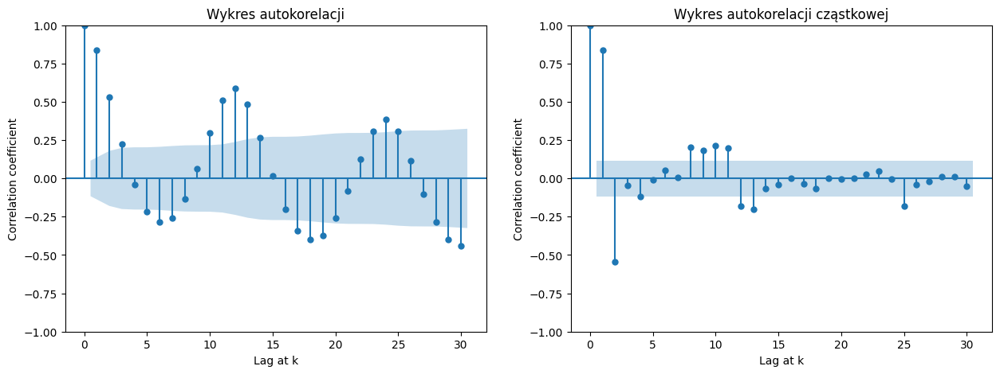

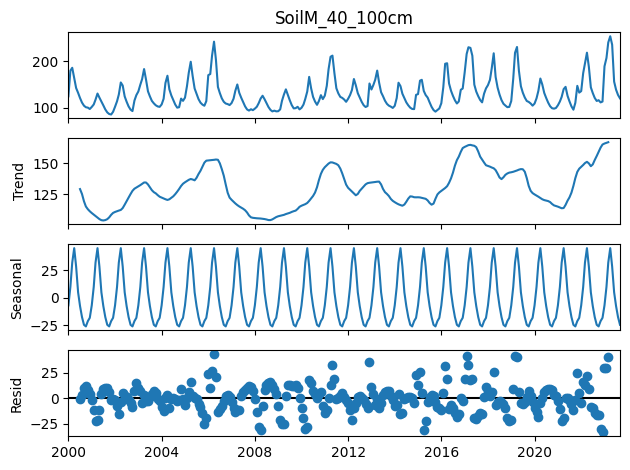

In [ ]:
plot_acf_and_pacf(SoilM_40_100cm_time_series_nie_pustynia, "SoilM_40_100cm", 30)
seasonal_decompose(SoilM_40_100cm_time_series_nie_pustynia['SoilM_40_100cm'], model="additive", period=12).plot().show()

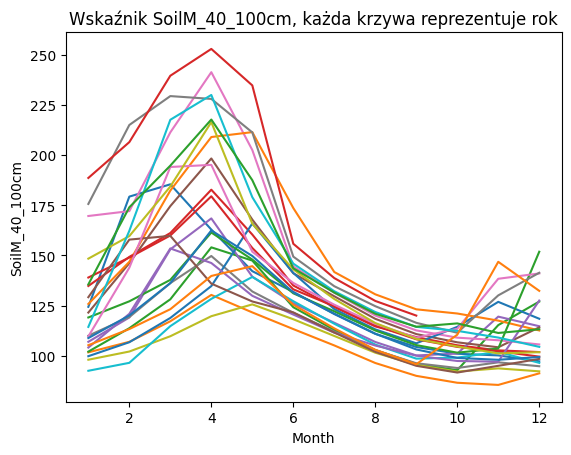

Mean squared error: 954.977
Coefficient of determination: 0.405


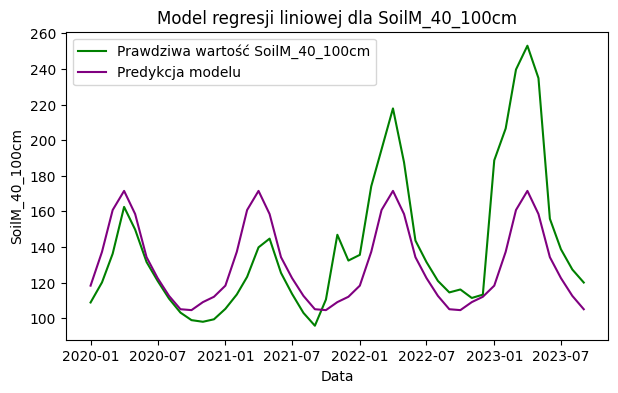

In [ ]:
plot_variable_to_check_yearly_seasonality(SoilM_40_100cm_time_series_nie_pustynia, 'SoilM_40_100cm')
fit_linear_model_and_plot_predictions(SoilM_40_100cm_time_series_nie_pustynia, 'SoilM_40_100cm', 2020)

Mean squared error: 939.268
Coefficient of determination: 0.415


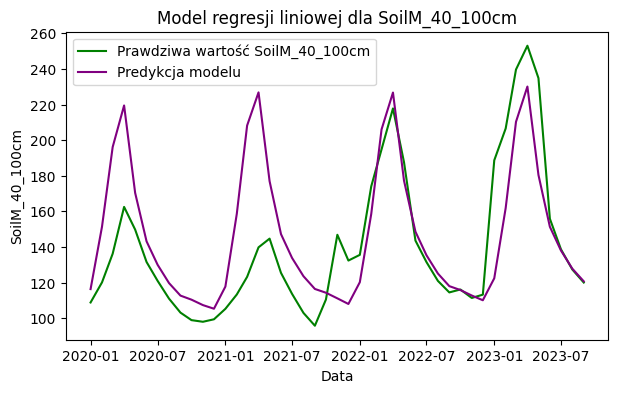

In [ ]:
fit_sarima_and_plot_predictions(SoilM_40_100cm_time_series_nie_pustynia, 'SoilM_40_100cm', 2020, 2,0,0, 1,1,0,12)

Wzór trendu liniowego: 0.088799 * x + 118.012249
Wzór trendu wielomianowego: 0.0 * x^5 + -1e-06 * x^4 + 0.000231 * x^3 + -0.023311 * x^2 + 0.897643 * x + 115.525022


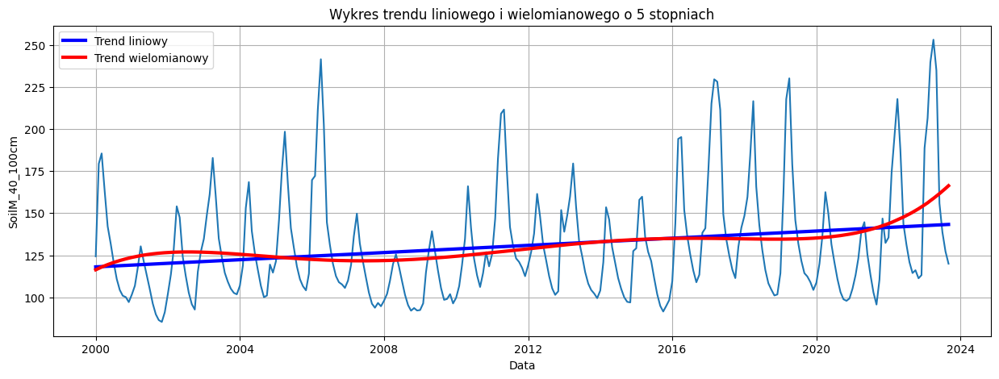

In [ ]:
plot_linear_and_polynomial_trend(SoilM_40_100cm_time_series_nie_pustynia, 'SoilM_40_100cm', 5)

Analiza dla obszaru przejściowego.

In [ ]:
perform_augumented_dickey_fuller_print_result(SoilM_40_100cm_time_series_przejsciowe, 'SoilM_40_100cm', True)

ADF Statistic: -3.8074
p-value: 0.0162
Critical Values:
1%, -3.993
5%, -3.427
10%, -3.137


'Stationary'

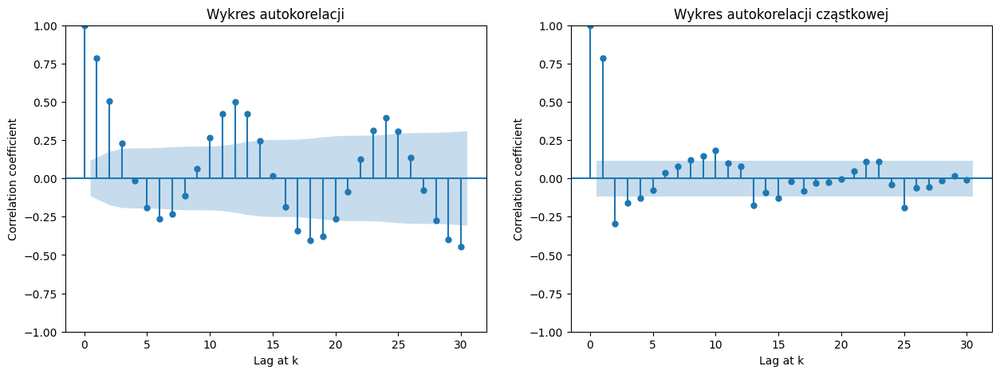

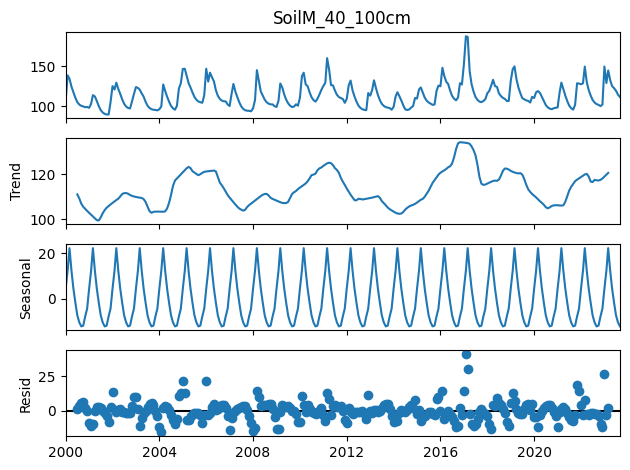

In [ ]:
plot_acf_and_pacf(SoilM_40_100cm_time_series_przejsciowe, "SoilM_40_100cm", 30)
seasonal_decompose(SoilM_40_100cm_time_series_przejsciowe['SoilM_40_100cm'], model="additive", period=12).plot().show()

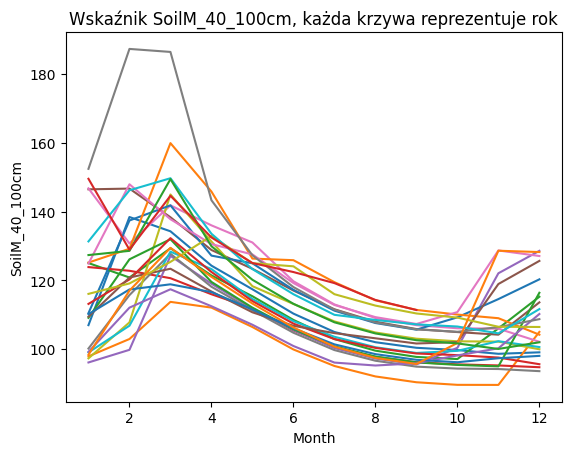

Mean squared error: 101.958
Coefficient of determination: 0.505


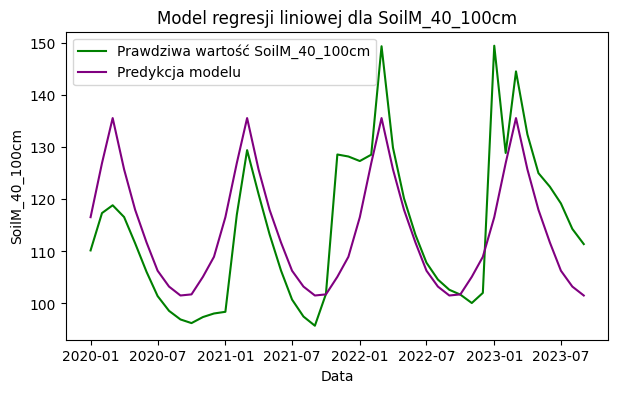

In [ ]:
plot_variable_to_check_yearly_seasonality(SoilM_40_100cm_time_series_przejsciowe, 'SoilM_40_100cm')
fit_linear_model_and_plot_predictions(SoilM_40_100cm_time_series_przejsciowe, 'SoilM_40_100cm', 2020)

Mean squared error: 163.778
Coefficient of determination: 0.205


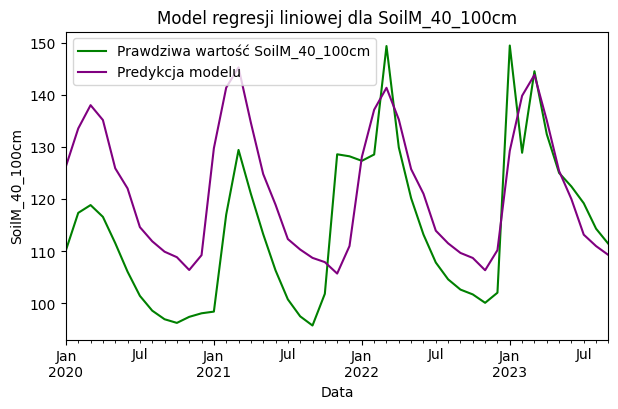

In [ ]:
fit_sarima_and_plot_predictions(SoilM_40_100cm_time_series_przejsciowe, 'SoilM_40_100cm', 2020, 2,0,0, 1,1,0,12)

Wzór trendu liniowego: 0.031649 * x + 109.0636
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 7e-06 * x^3 + -0.000887 * x^2 + 0.087779 * x + 107.691399


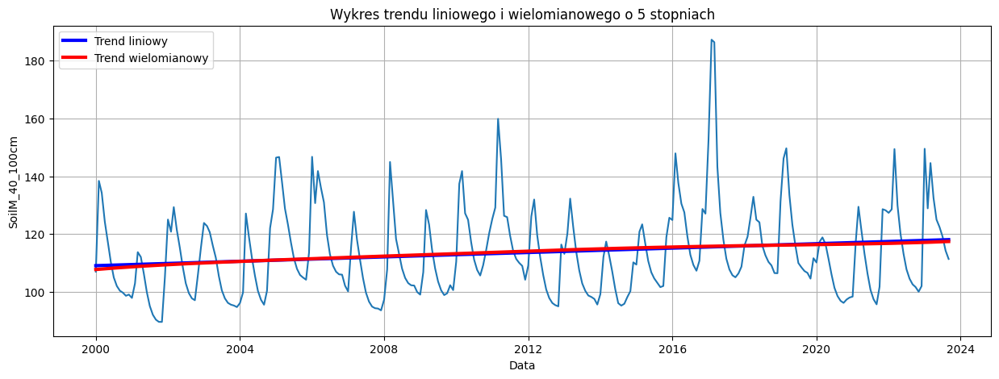

In [ ]:
plot_linear_and_polynomial_trend(SoilM_40_100cm_time_series_przejsciowe, 'SoilM_40_100cm', 5)

Analiza dla obszaru pustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(SoilM_40_100cm_time_series_pustynia, 'SoilM_40_100cm', True)

ADF Statistic: -5.9303
p-value: 0.0
Critical Values:
1%, -3.991
5%, -3.426
10%, -3.136


'Stationary'

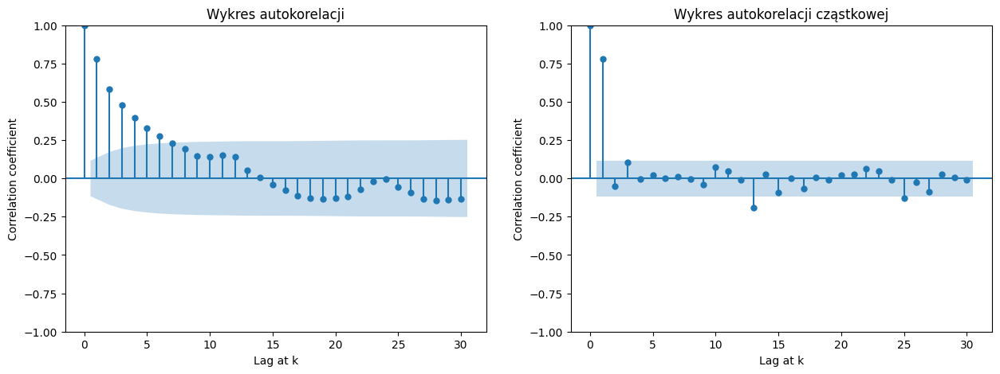

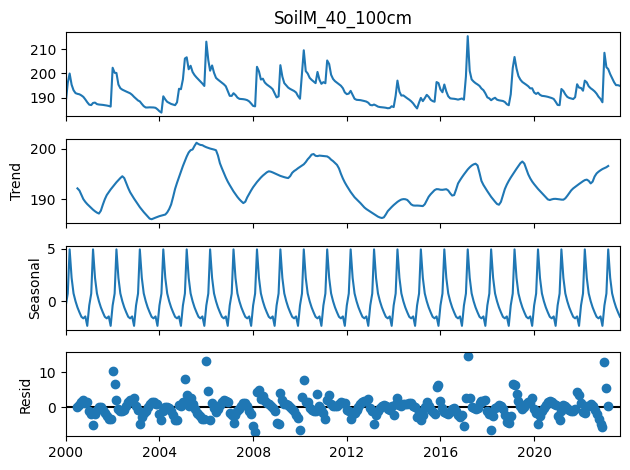

In [ ]:
plot_acf_and_pacf(SoilM_40_100cm_time_series_pustynia, "SoilM_40_100cm", 30)
seasonal_decompose(SoilM_40_100cm_time_series_pustynia['SoilM_40_100cm'], model="additive", period=12).plot().show()

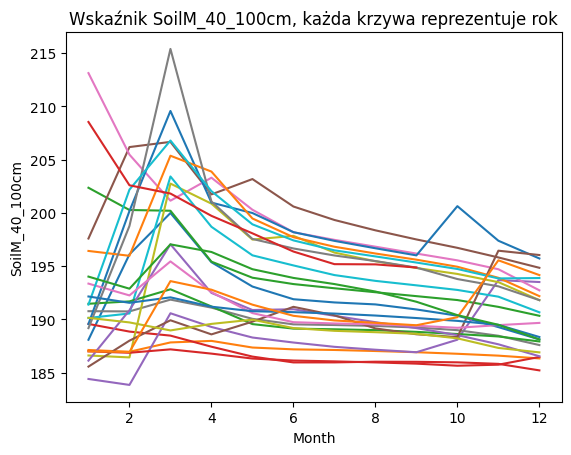

Mean squared error: 16.162
Coefficient of determination: 0.088


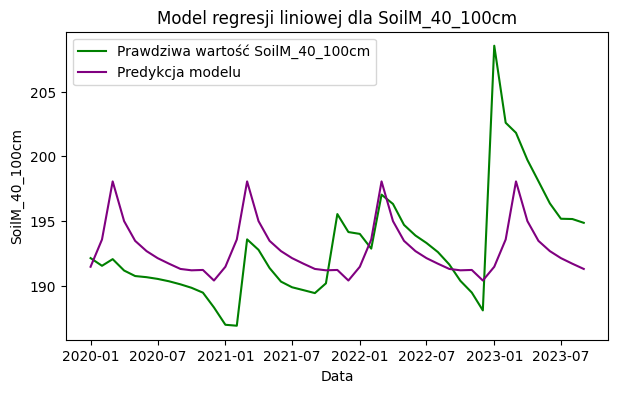

In [ ]:
plot_variable_to_check_yearly_seasonality(SoilM_40_100cm_time_series_pustynia, 'SoilM_40_100cm')
fit_linear_model_and_plot_predictions(SoilM_40_100cm_time_series_pustynia, 'SoilM_40_100cm', 2020)

Mean squared error: 22.008
Coefficient of determination: -0.242


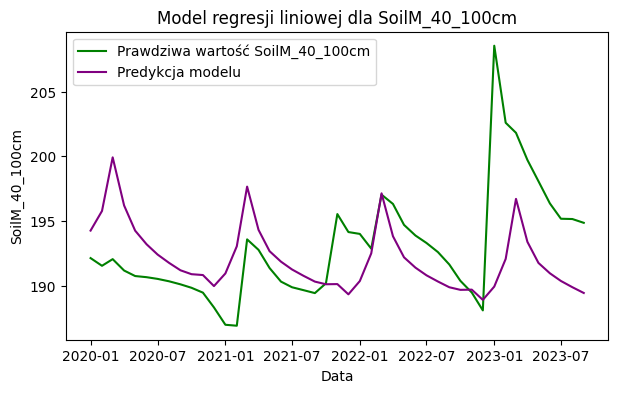

In [ ]:
fit_sarima_and_plot_predictions(SoilM_40_100cm_time_series_pustynia, 'SoilM_40_100cm', 2020, 1,0,1, 0,1,1,12)

Wzór trendu liniowego: 0.003511 * x + 192.242492
Wzór trendu wielomianowego: -0.0 * x^5 + 0.0 * x^4 + -8.3e-05 * x^3 + 0.008303 * x^2 + -0.253946 * x + 192.457575


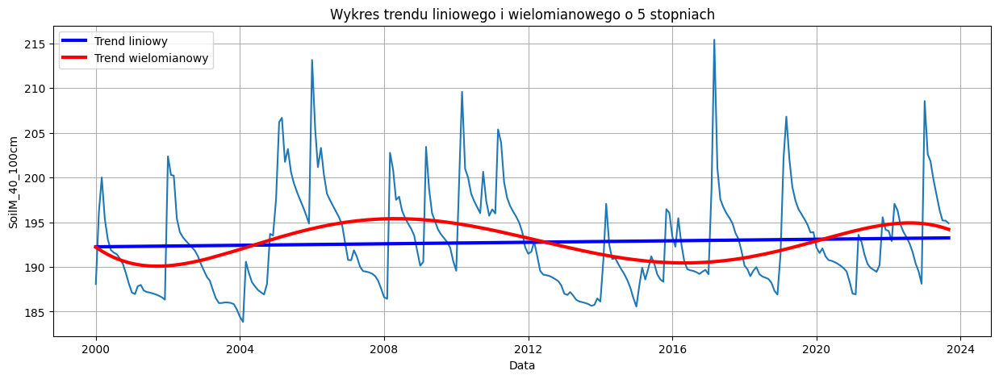

In [ ]:
plot_linear_and_polynomial_trend(SoilM_40_100cm_time_series_pustynia, 'SoilM_40_100cm', 5)

## **GVEG** (wskaźnik roślinności)

In [ ]:
#Pomiaru zawsze na 1 dzień miesiąca.
GVEG_SparkDataFrame = spark.sql("""
                        SELECT
                        lon, lat, Year, Month,
                        to_date(CONCAT(Year, '-', Month, '-1')) as Date, GVEG
                        FROM nasa_ym
                        order by lon, lat, Year, Month
                        """)

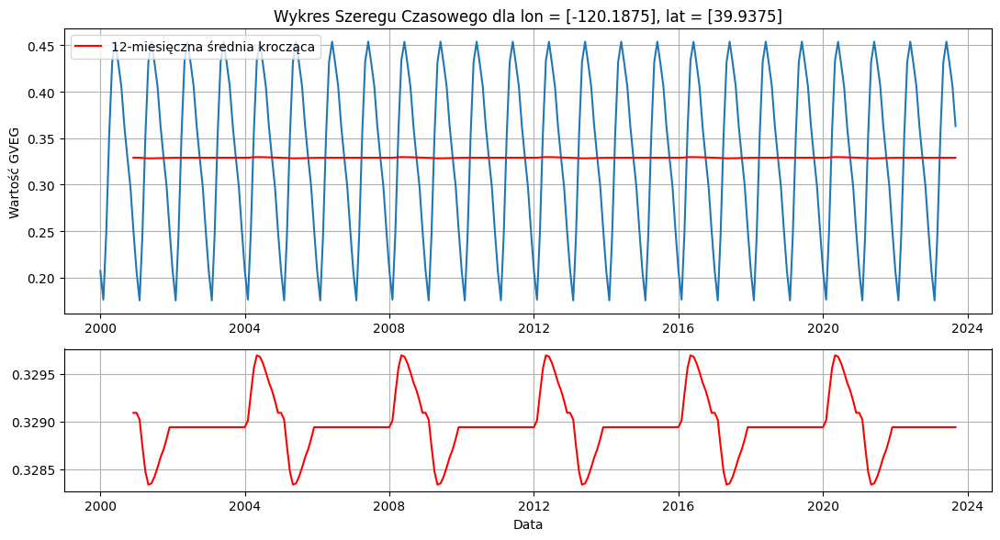

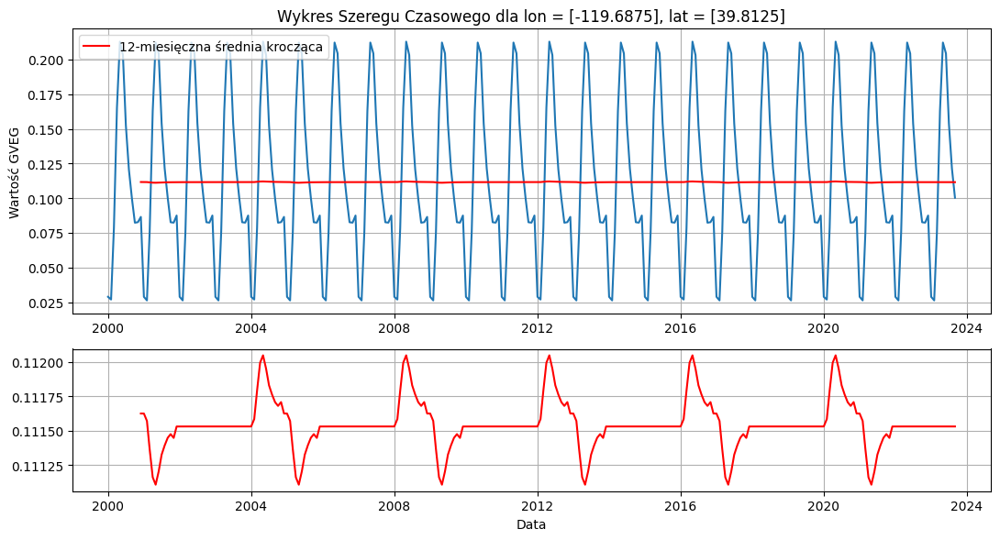

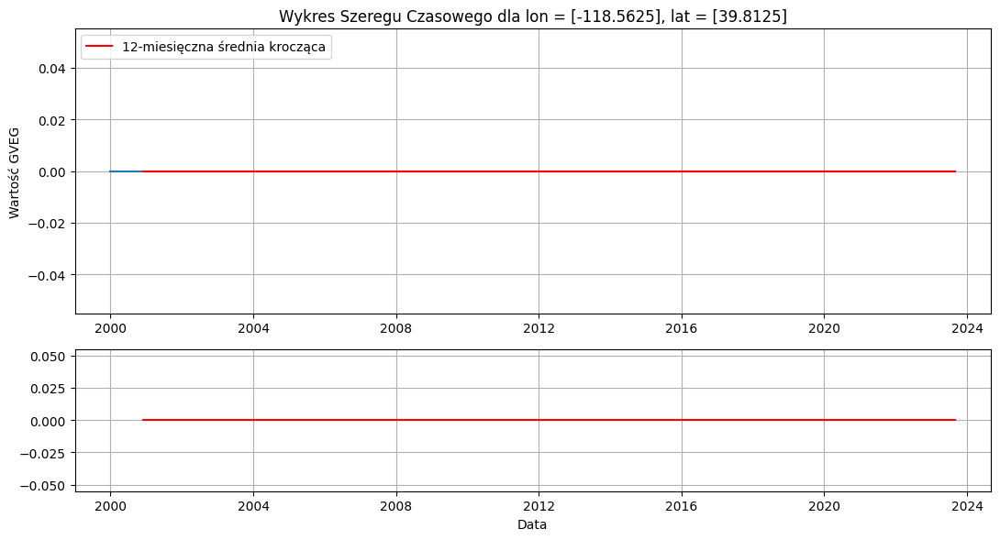

In [ ]:
GVEG_time_series_nie_pustynia = extract_time_series_from_dataframe(GVEG_SparkDataFrame, -120.1875, 39.9375)
GVEG_time_series_przejsciowe = extract_time_series_from_dataframe(GVEG_SparkDataFrame, -119.6875, 39.8125)
GVEG_time_series_pustynia = extract_time_series_from_dataframe(GVEG_SparkDataFrame, -118.5625, 39.8125)
plot_time_series(GVEG_time_series_nie_pustynia, 'GVEG')
plot_time_series(GVEG_time_series_przejsciowe, 'GVEG')
plot_time_series(GVEG_time_series_pustynia, 'GVEG')

Analiza dla obszaru niepustynnego.

In [ ]:
perform_augumented_dickey_fuller_print_result(GVEG_time_series_nie_pustynia, 'GVEG', True)

ADF Statistic: -6.3487
p-value: 0.0
Critical Values:
1%, -3.993
5%, -3.427
10%, -3.137


'Stationary'

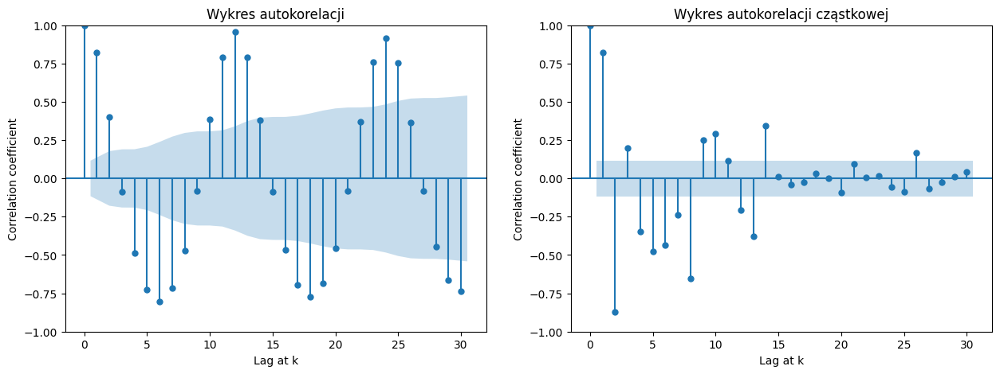

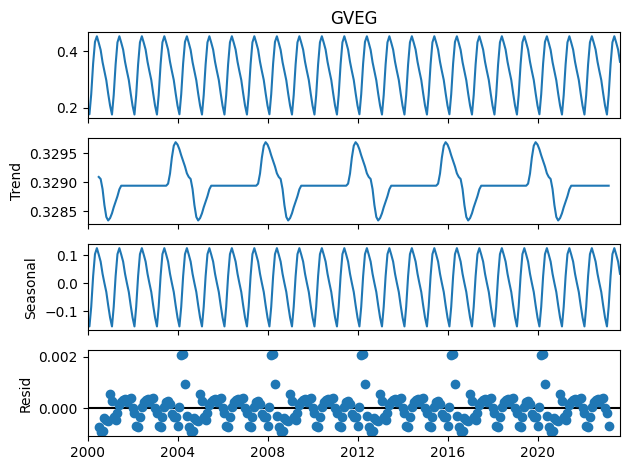

In [ ]:
plot_acf_and_pacf(GVEG_time_series_nie_pustynia, "GVEG", 30)
seasonal_decompose(GVEG_time_series_nie_pustynia['GVEG'], model="additive", period=12).plot().show()

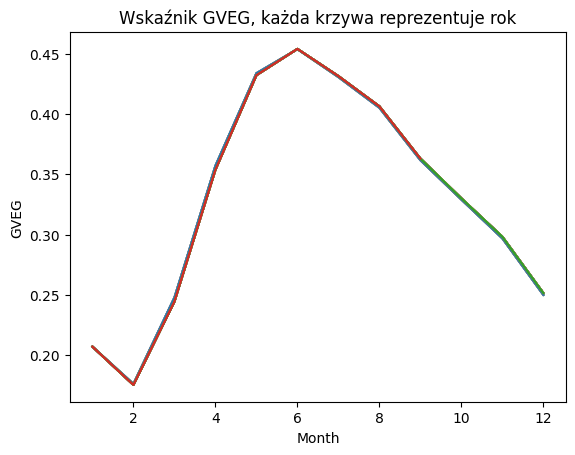

Mean squared error: 0.0
Coefficient of determination: 1.0


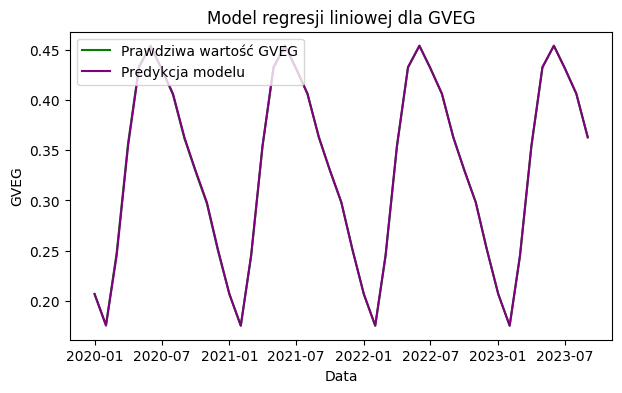

In [ ]:
plot_variable_to_check_yearly_seasonality(GVEG_time_series_nie_pustynia, 'GVEG')
fit_linear_model_and_plot_predictions(GVEG_time_series_nie_pustynia, 'GVEG', 2020)

Wzór trendu liniowego: 2.1e-05 * x + 0.326338
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 0.0 * x^3 + -3.3e-05 * x^2 + 0.001478 * x + 0.309952


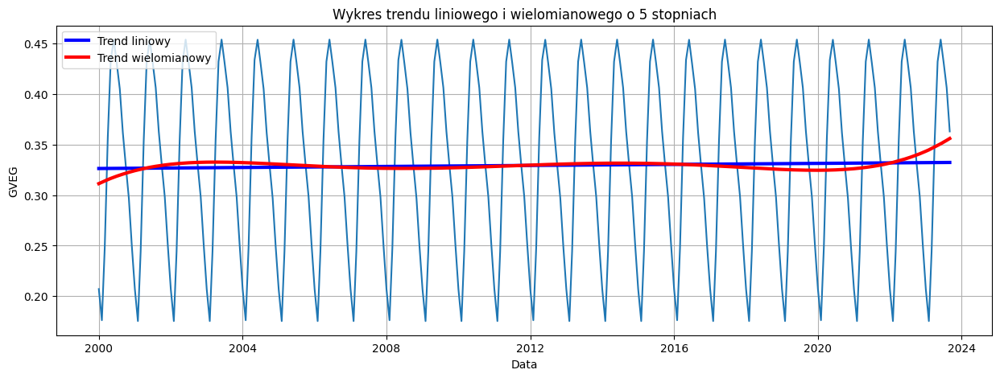

In [ ]:
plot_linear_and_polynomial_trend(GVEG_time_series_nie_pustynia, 'GVEG', 5)

Analiza dla obszaru przejściowego.

In [ ]:
perform_augumented_dickey_fuller_print_result(GVEG_time_series_przejsciowe, 'GVEG', True)

ADF Statistic: -5.6607
p-value: 0.0
Critical Values:
1%, -3.993
5%, -3.427
10%, -3.137


'Stationary'

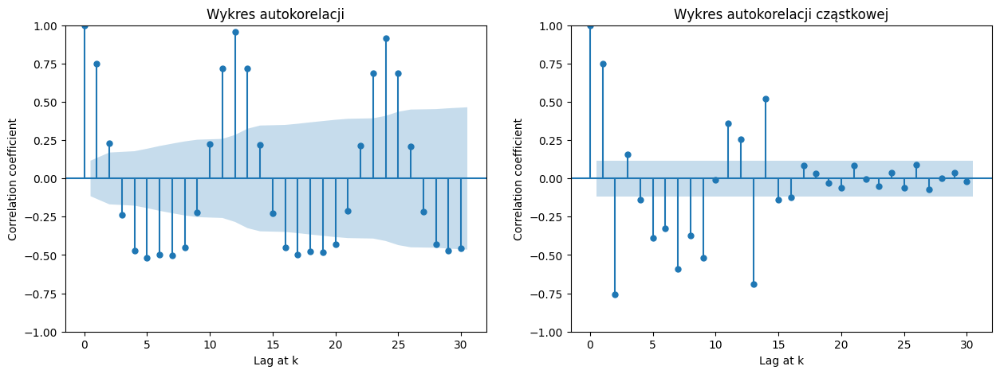

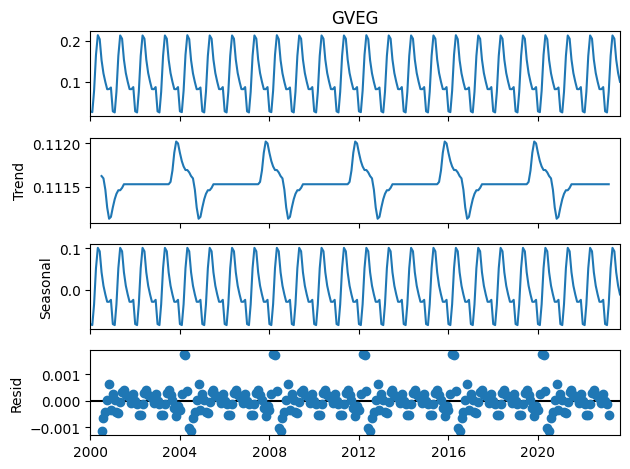

In [ ]:
plot_acf_and_pacf(GVEG_time_series_przejsciowe, "GVEG", 30)
seasonal_decompose(GVEG_time_series_przejsciowe['GVEG'], model="additive", period=12).plot().show()

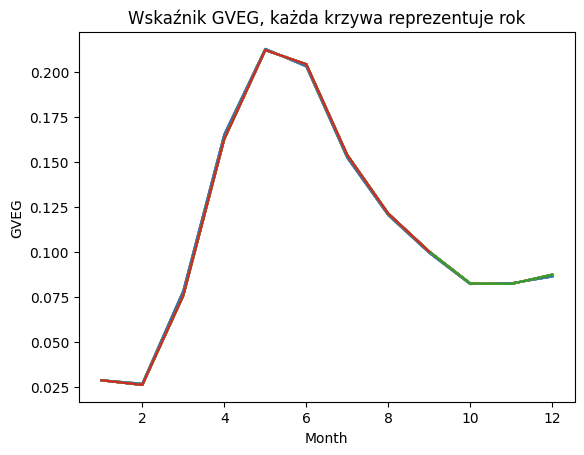

Mean squared error: 0.0
Coefficient of determination: 1.0


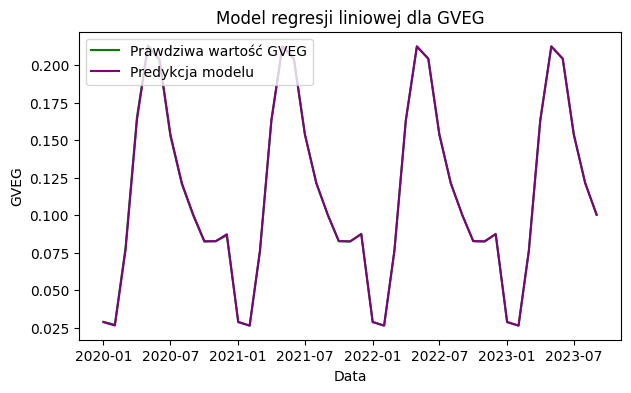

In [ ]:
plot_variable_to_check_yearly_seasonality(GVEG_time_series_przejsciowe, 'GVEG')
fit_linear_model_and_plot_predictions(GVEG_time_series_przejsciowe, 'GVEG', 2020)

Wzór trendu liniowego: 9e-06 * x + 0.110487
Wzór trendu wielomianowego: 0.0 * x^5 + -0.0 * x^4 + 0.0 * x^3 + -1.4e-05 * x^2 + 0.000584 * x + 0.104616


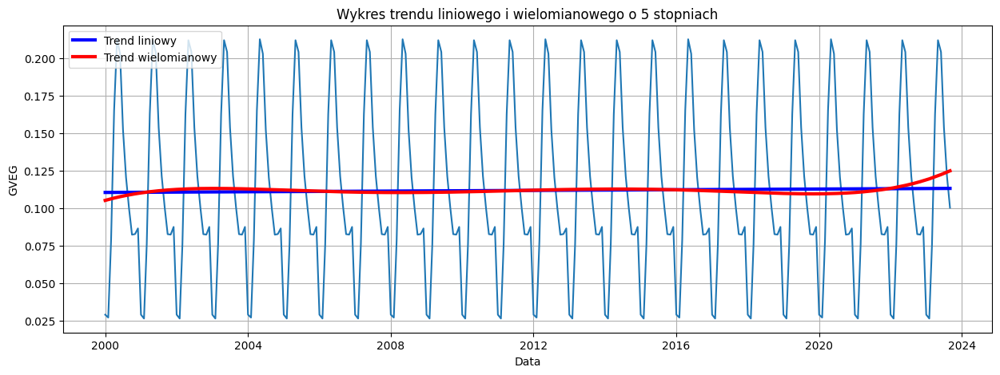

In [ ]:
plot_linear_and_polynomial_trend(GVEG_time_series_przejsciowe, 'GVEG', 5)